# Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score, KFold
from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_regression, RFECV
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, VotingRegressor, StackingRegressor
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans
import hdbscan
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import string
import pickle
import re
from datetime import datetime
import time
import folium
from folium.plugins import MarkerCluster
import random
import swifter
from joblib import Parallel, delayed
from tqdm import tqdm
from tqdm_joblib import tqdm_joblib
# Download NLTK resources
nltk.download('vader_lexicon', quiet=True)
nltk.download('punkt', quiet=True)
nltk.download('stopwords', quiet=True)
nltk.download('wordnet', quiet=True)

# Set random seed for reproducibility
RANDOM_STATE = 0
np.random.seed(RANDOM_STATE)
dictionary_missing_values = {
}
# Function for better display of dataframes in notebook
def display_df(df, rows=5):
    return df.head(rows)


# Loading dataset

In [2]:
df = pd.read_csv('train_data.csv')
print(f"Dataset shape: {df.shape}")

Dataset shape: (7724, 69)


# Divide Columns

In [3]:
# Define column groups based on data type and content
id_cols = ['id', 'host_id']
url_cols = ['listing_url', 'host_url', 'thumbnail_url']
text_cols = ['name', 'summary', 'space', 'description', 'neighborhood_overview',
             'notes', 'transit', 'access', 'interaction', 'house_rules', 'host_about']
date_cols = ['host_since', 'first_review', 'last_review']
dictionary_missing_values['host_since'] = pd.Timestamp('2025-01-01')
dictionary_missing_values['first_review'] = pd.Timestamp('2025-01-01')
price_cols = ['nightly_price', 'price_per_stay', 'security_deposit', 'cleaning_fee', 'extra_people']
binary_cols = ['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'is_location_exact',
               'requires_license', 'instant_bookable', 'is_business_travel_ready',
               'require_guest_profile_picture', 'require_guest_phone_verification']
location_cols = ['neighbourhood', 'neighbourhood_cleansed', 'city', 'state', 'zipcode', 'market',
                'smart_location', 'country_code', 'country', 'street', 'latitude', 'longitude']
property_cols = ['property_type', 'room_type', 'accommodates', 'bathrooms',
                'bedrooms', 'beds', 'bed_type', 'square_feet']
host_cols = ['host_name', 'host_location', 'host_response_time', 'host_response_rate',
            'host_acceptance_rate', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count']
booking_cols = ['guests_included', 'minimum_nights', 'maximum_nights', 'number_of_reviews',
               'number_of_stays', 'cancellation_policy']

# Target column
target_col = 'guest_satisfaction'


# info of Data

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7724 entries, 0 to 7723
Data columns (total 69 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                7724 non-null   int64  
 1   listing_url                       7724 non-null   object 
 2   name                              7724 non-null   object 
 3   summary                           7521 non-null   object 
 4   space                             6304 non-null   object 
 5   description                       7638 non-null   object 
 6   neighborhood_overview             5733 non-null   object 
 7   notes                             4625 non-null   object 
 8   transit                           5281 non-null   object 
 9   access                            5316 non-null   object 
 10  interaction                       5461 non-null   object 
 11  house_rules                       5981 non-null   object 
 12  thumbn

In [5]:
df.shape

(7724, 69)

In [6]:
df.columns

Index(['id', 'listing_url', 'name', 'summary', 'space', 'description',
       'neighborhood_overview', 'notes', 'transit', 'access', 'interaction',
       'house_rules', 'thumbnail_url', 'host_id', 'host_url', 'host_name',
       'host_since', 'host_location', 'host_about', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_has_profile_pic',
       'host_identity_verified', 'street', 'neighbourhood',
       'neighbourhood_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'square_feet',
       'nightly_price', 'price_per_stay', 'security_deposit', 'cleaning_fee',
       'guests_included', 'extra_people', 'minimum_nights', 'maximum_nights',

In [7]:
df.head()

,id,listing_url,name,summary,space,description,neighborhood_overview,notes,transit,access,...,number_of_stays,first_review,last_review,guest_satisfaction,requires_license,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
0,6529502,https://www.airbnb.com/rooms/6529502,TWIN BEACH BUNGALOW #2,Ocean Beach California is a small beach commun...,Original 1950's beach bungalow. 1BR/1BA with ...,Ocean Beach California is a small beach commun...,"Beautiful beaches, great food, relaxed vibe. W...",Sea World - 2.2 mi. Mission Beach 2.7 mi.,One parking spot for each bungalow in the back...,Our cottages are 1 ½ blocks to one of the best...,...,242,5/31/2015,8/4/2019,Average,f,t,f,moderate,f,f
1,21066826,https://www.airbnb.com/rooms/21066826,Private Room and Private Bath,My place is in the heart of North Park. It's w...,NaN,My place is in the heart of North Park. It's w...,The area is safe and quiet day and night. Stre...,We will have to coordinate to open the door. ...,Use Lyft or Uber. There are also many bus stop...,You will have full access to a private bedroom...,...,54,2/17/2019,5/5/2019,Very High,f,f,f,strict_14_with_grace_period,f,f
2,17694144,https://www.airbnb.com/rooms/17694144,A+ 3BED!! Steps to BEACH and BAY!!,This cozy beach cottage is less 75 steps to th...,Great 400sf roof top patio with furniture and ...,This cozy beach cottage is less 75 steps to th...,Beach town! You can walk everywhere: to the ba...,**If you are unable to book my place due to re...,Bikes are the best way to get around town as p...,PlEASE READ!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!! P...,...,402,4/16/2017,7/28/2019,Average,f,t,f,strict_14_with_grace_period,f,f
3,8037037,https://www.airbnb.com/rooms/8037037,1925 Hillcrest Cottage with Private Sundeck,"Location, Location, Location! Escape to beau...",Private and Cozy Stand Alone Cottage with acce...,"Location, Location, Location! Escape to beau...",Hillcrest and North Park are eclectic neighbor...,The cottage is down a flight of stairs in the ...,All you need is in walking distance but the pu...,"As a guest, you will have the whole space to y...",...,526,3/10/2016,8/15/2019,High,f,t,f,strict_14_with_grace_period,f,f
4,3251171,https://www.airbnb.com/rooms/3251171,Cozy Beach Getaway K-2,Soak in the sun from your private courtside pa...,Only a short walk to Mission Beach and the Pac...,Soak in the sun from your private courtside pa...,NaN,***PLEASE NOTE THAT THE MONTHLY DISCOUNT DOESN...,We have lots of transportation available if yo...,There is cable TV and a DVD play in the living...,...,2,7/21/2018,7/21/2018,Very High,f,f,f,strict_14_with_grace_period,f,f


# Check Data "Nulls , Duplication"

In [ ]:
df.isnull().sum()


0    strict_14_with_grace_period
Name: cancellation_policy, dtype: object



Columns with high missing values:
thumbnail_url           100.000000
host_acceptance_rate    100.000000
square_feet              98.770067
notes                    40.121699
dtype: float64


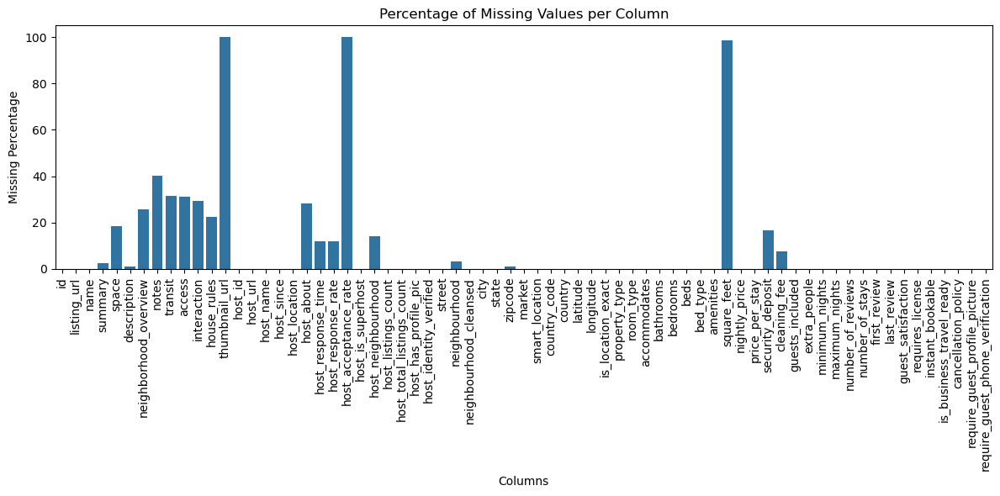

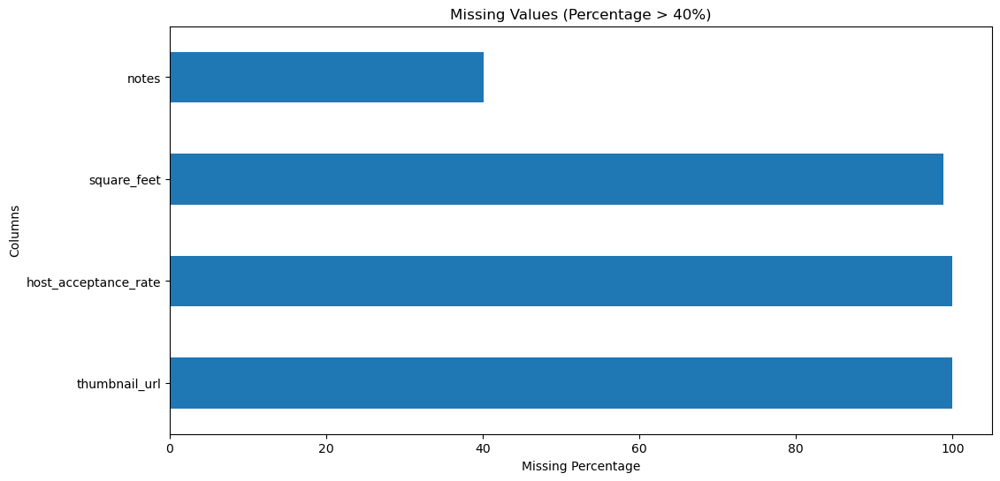

In [9]:
missing_percent = (df.isnull().sum() / len(df)) * 100
print("\nColumns with high missing values:")
print(missing_percent[missing_percent > 40].sort_values(ascending=False))

# Generate a bar plot of missing values
plt.figure(figsize=(12, 6))
sns.barplot(x=missing_percent.index, y=missing_percent.values)
plt.xticks(rotation=90)
plt.xlabel("Columns")
plt.ylabel("Missing Percentage")
plt.title("Percentage of Missing Values per Column")
plt.tight_layout()
plt.show()

# Generate a horizontal bar plot of missing values (for better readability if many columns)
plt.figure(figsize=(12, 6))
missing_percent[missing_percent > 40].sort_values(ascending=False).plot(kind='barh')
plt.xlabel("Missing Percentage")
plt.ylabel("Columns")
plt.title("Missing Values (Percentage > 40%)")
plt.show()


In [10]:
import plotly.express as px

# Calculate missing percentage
missing_percent = (df.isnull().sum() / len(df)) * 100
print("\nColumns with high missing values:")
print(missing_percent[missing_percent > 40].sort_values(ascending=False))

# Interactive bar plot of missing values using plotly
fig = px.bar(
    x=missing_percent.index,
    y=missing_percent.values,
    labels={'x': 'Columns', 'y': 'Missing Percentage'},
    title='Percentage of Missing Values per Column',
    template='plotly_dark'
)

fig.update_layout(
    xaxis_title="Columns",
    yaxis_title="Missing Percentage",
    xaxis_tickangle=-45,
    showlegend=False
)

fig.show()

# Interactive horizontal bar plot of missing values (for better readability if many columns)
fig2 = px.bar(
    missing_percent[missing_percent > 40].sort_values(ascending=False),
    orientation='h',
    labels={'value': 'Missing Percentage', 'index': 'Columns'},
    title='Missing Values (Percentage > 40%)',
    template='plotly_dark'
)

fig2.update_layout(
    xaxis_title="Missing Percentage",
    yaxis_title="Columns",
    showlegend=False
)

fig2.show()



Columns with high missing values:
thumbnail_url           100.000000
host_acceptance_rate    100.000000
square_feet              98.770067
notes                    40.121699
dtype: float64


In [11]:
drop_cols = ['host_acceptance_rate', 'square_feet']
df = df.drop(drop_cols, axis=1)

In [12]:
duplicate_count = df.duplicated().sum()
if duplicate_count > 0:
    df = df.drop_duplicates()
    print(f"Duplicates dropped. New shape: {df.shape}")


# Check Columns

In [13]:
df[['host_listings_count','host_total_listings_count']].head()

,host_listings_count,host_total_listings_count
0,3.0,3.0
1,1.0,1.0
2,2.0,2.0
3,2.0,2.0
4,42.0,42.0


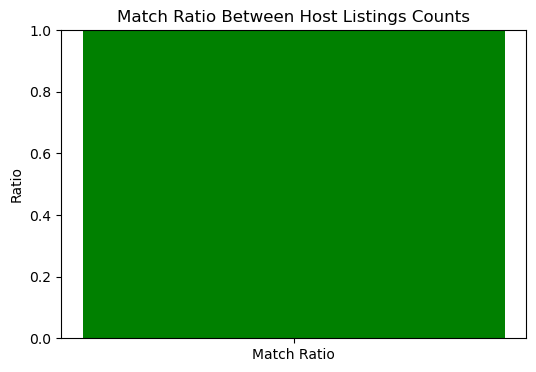

In [14]:
import matplotlib.pyplot as plt

# Calculate the match ratio
match_ratio = (df['host_listings_count'] == df['host_total_listings_count']).mean()

# Plotting
plt.figure(figsize=(6, 4))
plt.bar(['Match Ratio'], [match_ratio], color='green')
plt.ylim(0, 1)
plt.title('Match Ratio Between Host Listings Counts')
plt.ylabel('Ratio')
plt.show()


In [15]:
df.drop(['host_listings_count'], axis=1, inplace=True)

# Convert Object to Number

In [16]:
price_columns = ['nightly_price', 'price_per_stay', 'security_deposit', 'cleaning_fee', 'extra_people']
dictionary_missing_values['host_experience'] =0
for col in price_columns:
    if df[col].dtype == 'object':
        df[col] = df[col].replace('[\$,]', '', regex=True).astype(float)
dictionary_missing_values['price_per_stay'] = df['price_per_stay'].mean()
# 3. Convert percentage string to float
if 'host_response_rate' in df.columns and df['host_response_rate'].dtype == 'object':
    df['host_response_rate'] = df['host_response_rate'].str.replace('%', '').astype(float) / 100




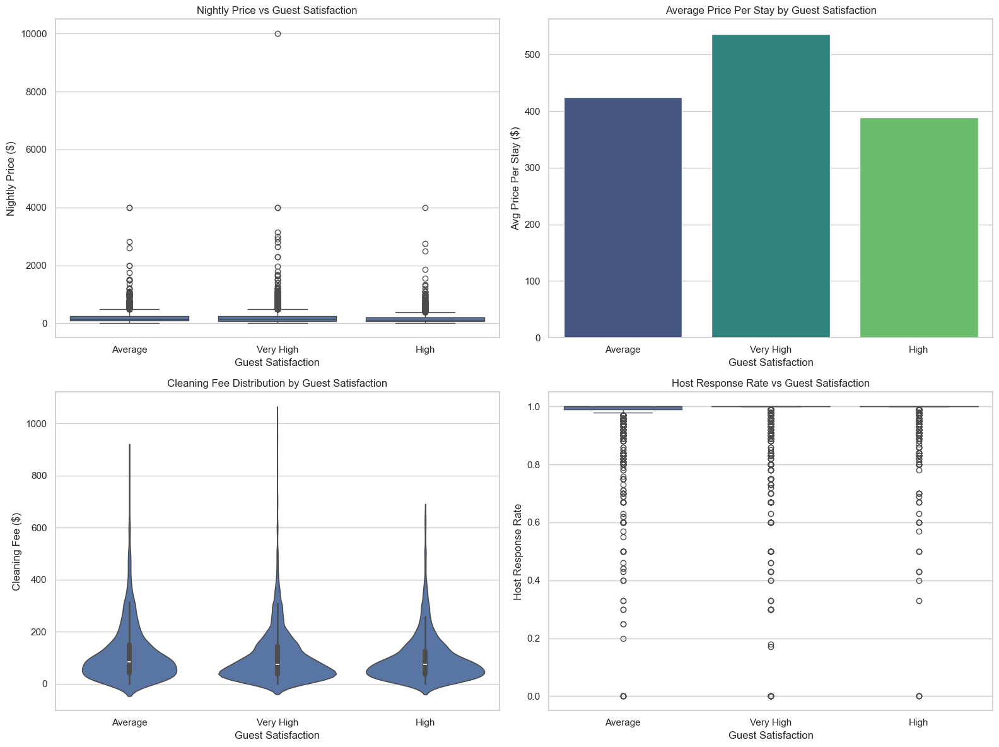

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# لتنسيق الرسومات
sns.set(style="whitegrid")
plt.figure(figsize=(16, 12))

# 1. Boxplot: توزيع nightly_price حسب فئة الرضا
plt.subplot(2, 2, 1)
sns.boxplot(x='guest_satisfaction', y='nightly_price', data=df)
plt.title('Nightly Price vs Guest Satisfaction')
plt.xlabel('Guest Satisfaction')
plt.ylabel('Nightly Price ($)')

# 2. Barplot: متوسط price_per_stay لكل فئة رضا
plt.subplot(2, 2, 2)
sns.barplot(x='guest_satisfaction', y='price_per_stay', data=df, ci=None, palette="viridis")
plt.title('Average Price Per Stay by Guest Satisfaction')
plt.xlabel('Guest Satisfaction')
plt.ylabel('Avg Price Per Stay ($)')

# 3. Violinplot: توزيع cleaning_fee حسب رضا الضيوف
plt.subplot(2, 2, 3)
sns.violinplot(x='guest_satisfaction', y='cleaning_fee', data=df)
plt.title('Cleaning Fee Distribution by Guest Satisfaction')
plt.xlabel('Guest Satisfaction')
plt.ylabel('Cleaning Fee ($)')

# 4. Boxplot: توزيع host_response_rate حسب رضا الضيوف
if 'host_response_rate' in df.columns:
    plt.subplot(2, 2, 4)
    sns.boxplot(x='guest_satisfaction', y='host_response_rate', data=df)
    plt.title('Host Response Rate vs Guest Satisfaction')
    plt.xlabel('Guest Satisfaction')
    plt.ylabel('Host Response Rate')

plt.tight_layout()
plt.show()


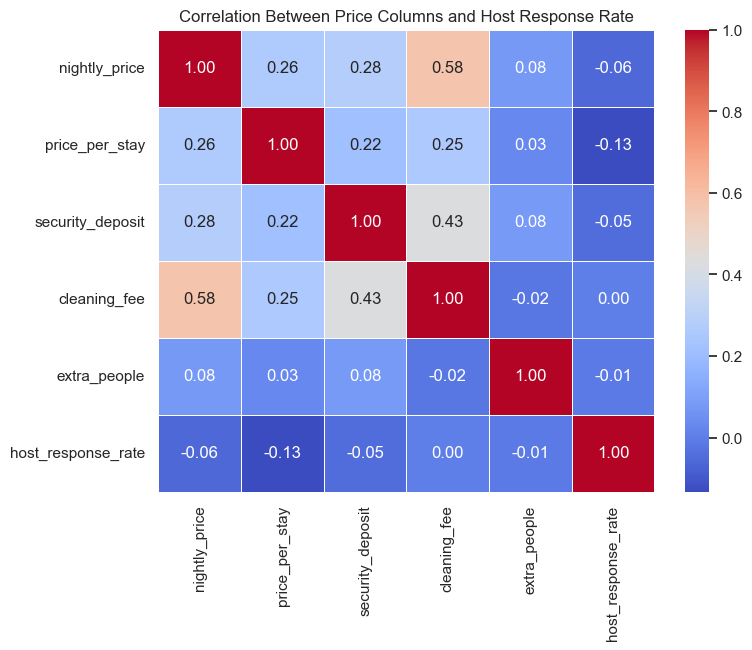

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# الأعمدة اللي هنحسب الترابط بينهم
price_columns = ['nightly_price', 'price_per_stay', 'security_deposit', 'cleaning_fee', 'extra_people']

# إضافة host_response_rate لو موجود
if 'host_response_rate' in df.columns:
    price_columns.append('host_response_rate')

# حساب المصفوفة الترابطية
corr_matrix = df[price_columns].corr()

# رسم الـ Heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Between Price Columns and Host Response Rate')
plt.show()


In [19]:
df.drop("thumbnail_url", axis = 1, inplace = True)

# Handle Missing Values

In [20]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
import pandas as pd

# Get all numeric columns
num_cols = df.select_dtypes(include=['int64', 'float64']).columns
x = pd.DataFrame(num_cols, columns=['Numeric Columns'])
print(x.info()  )
# Create a scaler for all numeric columns
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[num_cols])

# Apply KNN imputation on all numeric columns
imputer = KNNImputer(n_neighbors=5)
imputed_data = imputer.fit_transform(scaled_data)

# Transform back to original scale and update dataframe
df[num_cols] = pd.DataFrame(scaler.inverse_transform(imputed_data), columns=num_cols, index=df.index)

with open('scaler_model.pkl', 'wb') as file:
    pickle.dump(scaler, file)
    
with open('imputer_model.pkl', 'wb') as file:
    pickle.dump(imputer, file)




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 1 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Numeric Columns  20 non-null     object
dtypes: object(1)
memory usage: 292.0+ bytes
None


In [21]:
text_cols = ['name', 'summary', 'space', 'description', 'neighborhood_overview',
             'notes', 'transit', 'access', 'interaction', 'house_rules', 'host_about']
text_null_percentages = df[text_cols].isnull().sum() / len(df) * 100
print(text_null_percentages)


name                      0.000000
summary                   2.628172
space                    18.384257
description               1.113413
neighborhood_overview    25.776800
notes                    40.121699
transit                  31.628690
access                   31.175557
interaction              29.298291
house_rules              22.566028
host_about               28.366132
dtype: float64


In [22]:
# df[text_cols] = df[text_cols].fillna("")


In [ ]:
# For categorical columns
cat_cols = df.select_dtypes(include=['object']).columns
dict_missing_values = {}
for col in cat_cols:
        mode_val = df[col].mode()[0]
        df[col] = df[col].fillna(mode_val)
        dict_missing_values[col] = mode_val
        with open('modeOf.pkl', 'wb') as file:
                pickle.dump(imputer, file)
        
  


# HeatMap

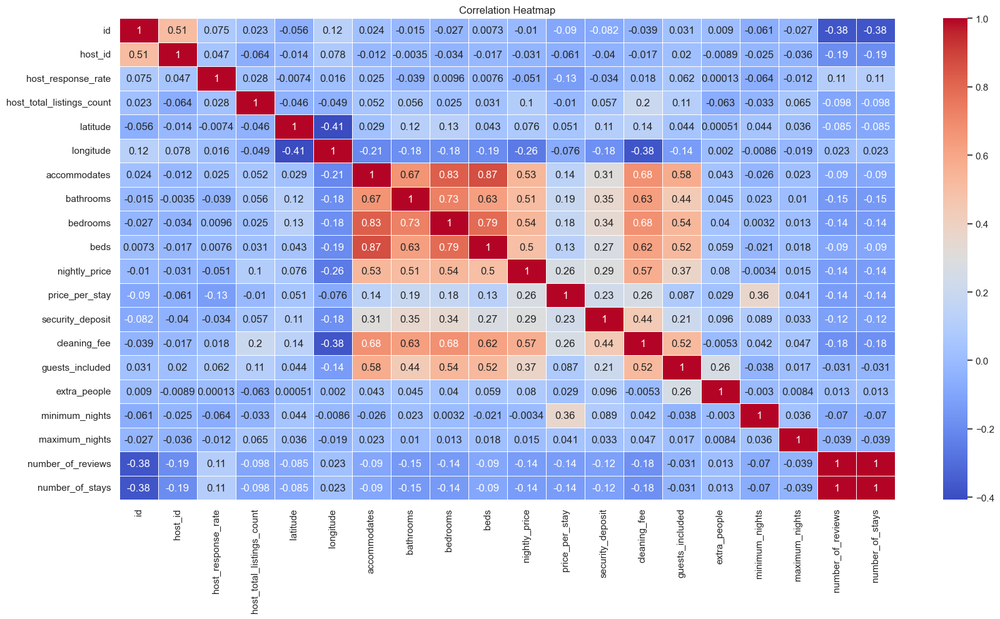

In [24]:
# Compute correlation matrix
corr_matrix = df[num_cols].corr() # Change: Select the data in df using num_cols

# Plot heatmap
plt.figure(figsize=(20,10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

# Visualization

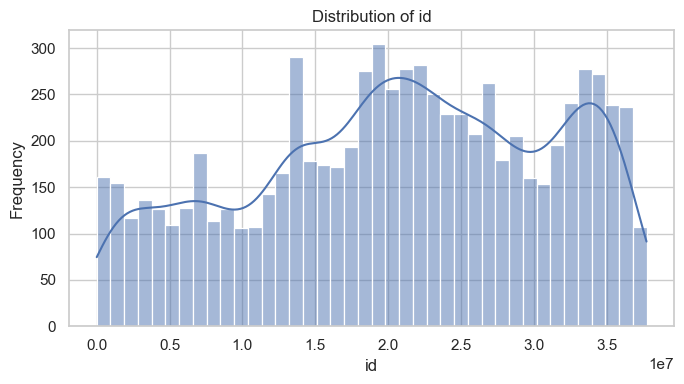

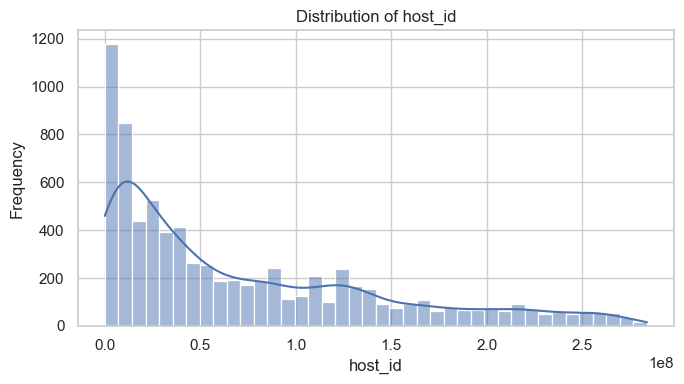

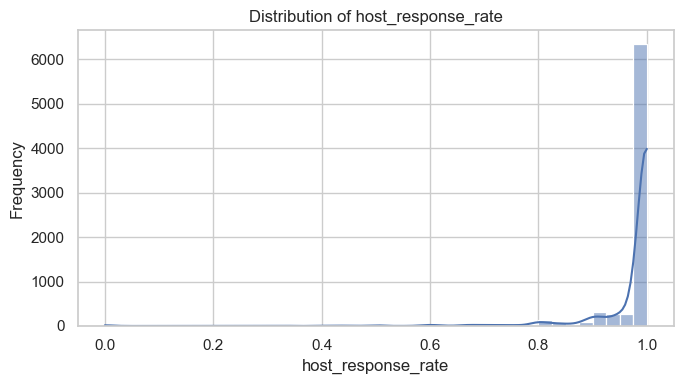

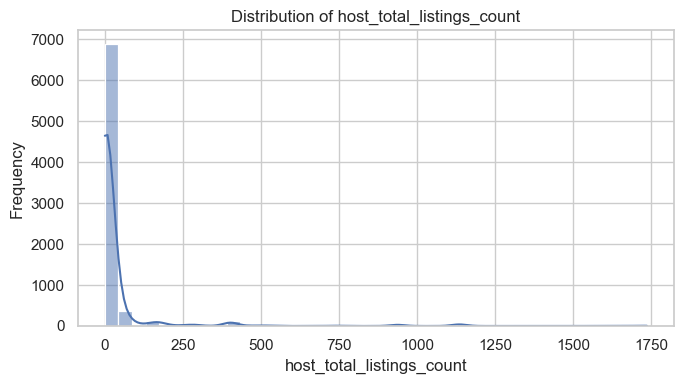

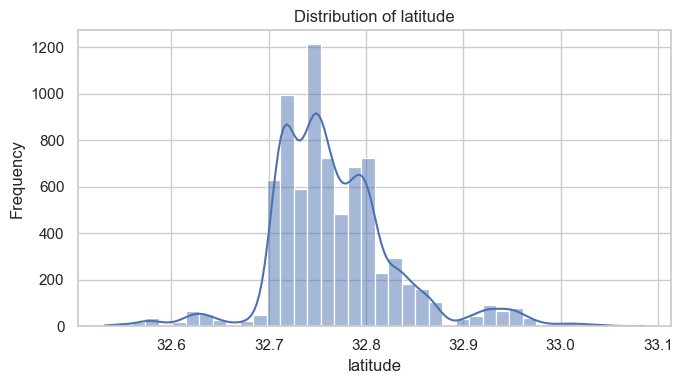

...

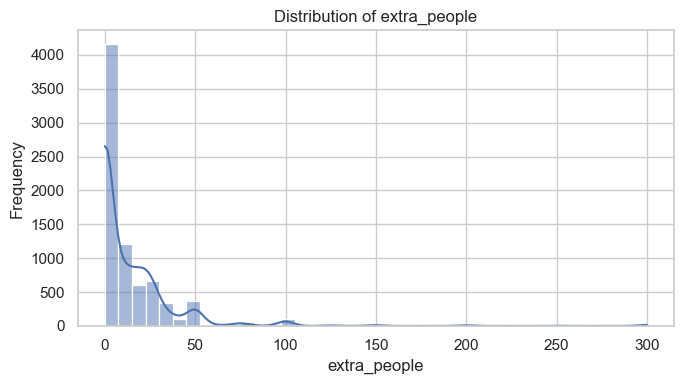

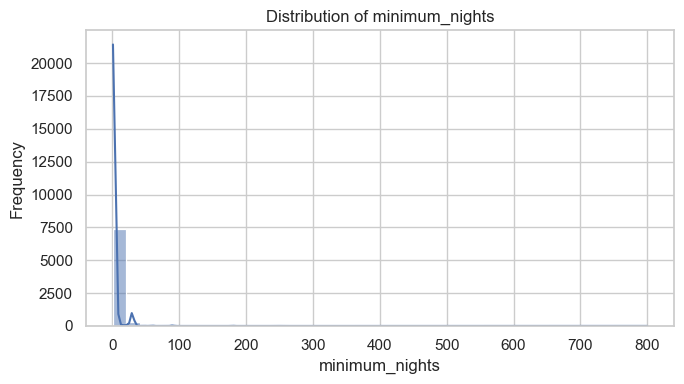

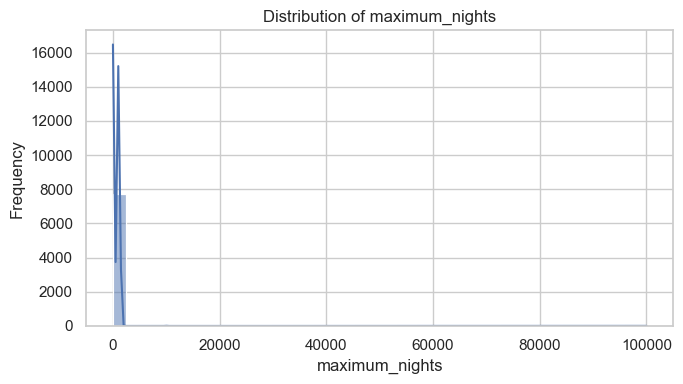

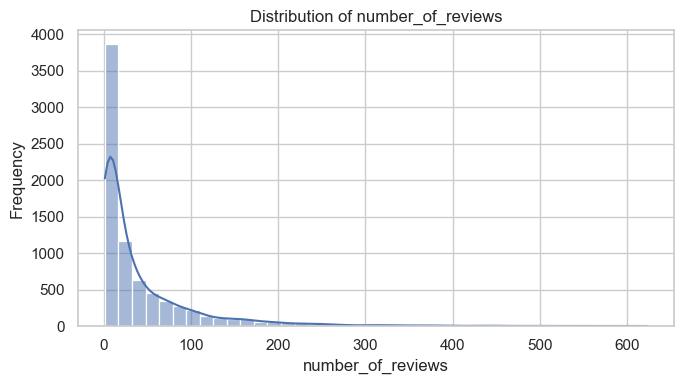

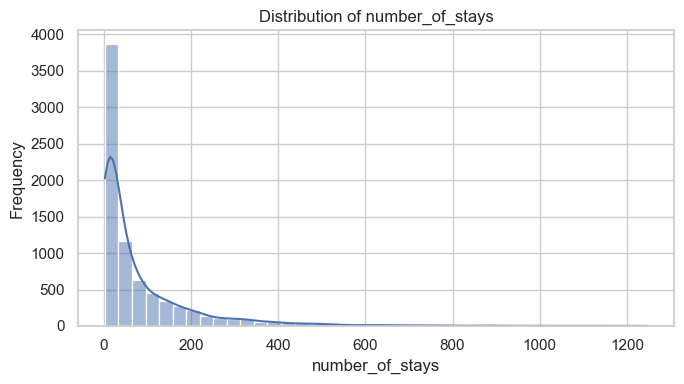

In [25]:
for col in num_cols:
    plt.figure(figsize=(7, 4))
    sns.histplot(df[col], kde=True, bins=40)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


In [26]:
import numpy as np

skewed_cols = ['nightly_price', 'price_per_stay', 'number_of_reviews', 'host_total_listings_count', 'number_of_stays']

for col in skewed_cols:
    df[f'{col}'] = np.log1p(df[col])


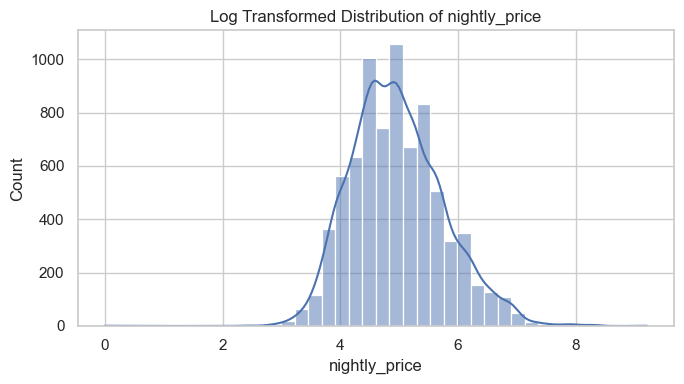

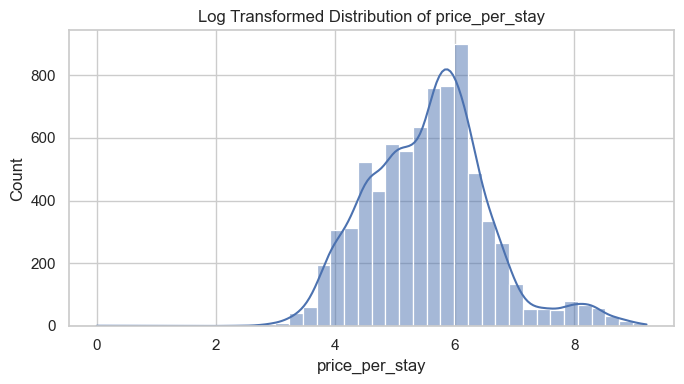

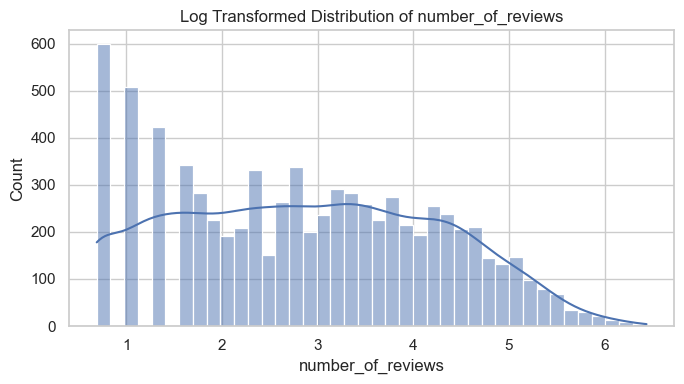

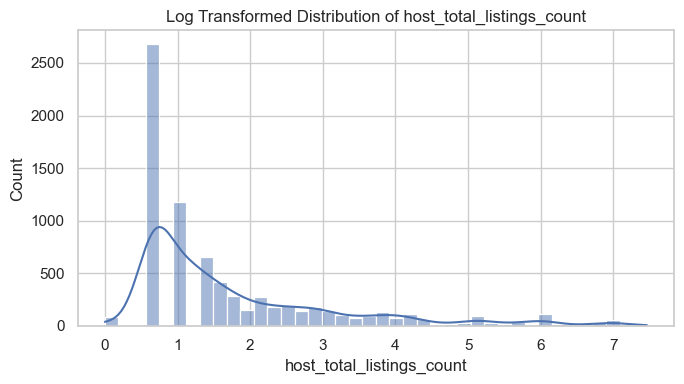

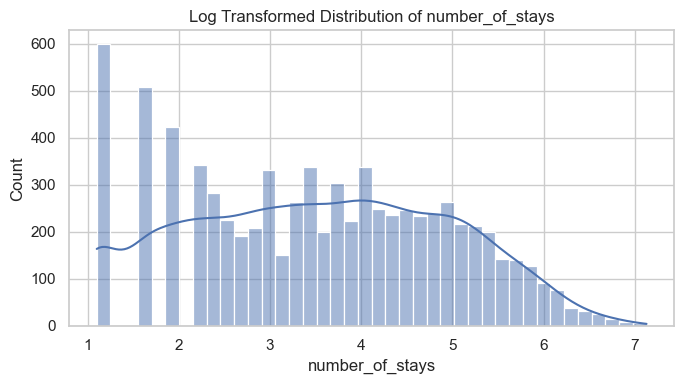

In [27]:
for col in skewed_cols:
    plt.figure(figsize=(7, 4))
    sns.histplot(df[f'{col}'], kde=True, bins=40)
    plt.title(f'Log Transformed Distribution of {col}')
    plt.tight_layout()
    plt.show()


# Check and Handle Outlires

In [28]:
# check outliers
# Create a dictionary to store outlier thresholds for each numeric column
outlier_thresholds = {}
numeric_cols = df.select_dtypes(include="number").columns

for col in numeric_cols:
    q25, q75 = np.percentile(df[col], 25), np.percentile(df[col], 75)
    iqr = q75 - q25
    cut_off = iqr * 1.5
    lower, upper = q25 - cut_off, q75 + cut_off
    outliers = (df[col] < lower) | (df[col] > upper)
    index_label = df[outliers].index
    print(f'Number of outliers in {col}: {len(index_label)}')
    
    # Save the threshold values for each column to use on another dataset
    outlier_thresholds[col] = {'lower_bound': lower, 'upper_bound': upper}

# Save the outlier thresholds to a file for later use
import pickle
with open('outlier_thresholds.pkl', 'wb') as file:
    pickle.dump(outlier_thresholds, file)


Number of outliers in id: 0
Number of outliers in host_id: 39
Number of outliers in host_response_rate: 1386
Number of outliers in host_total_listings_count: 472
Number of outliers in latitude: 463
Number of outliers in longitude: 42
Number of outliers in accommodates: 164
Number of outliers in bathrooms: 197
Number of outliers in bedrooms: 567
Number of outliers in beds: 293
Number of outliers in nightly_price: 58
Number of outliers in price_per_stay: 163
Number of outliers in security_deposit: 611
Number of outliers in cleaning_fee: 504
Number of outliers in guests_included: 456
Number of outliers in extra_people: 278
Number of outliers in minimum_nights: 548
Number of outliers in maximum_nights: 3
Number of outliers in number_of_reviews: 0
Number of outliers in number_of_stays: 0


In [29]:
import numpy as np

numeric_cols = df.select_dtypes(include="number").columns

for col in numeric_cols:
    q1 = np.percentile(df[col], 25)
    q3 = np.percentile(df[col], 75)
    iqr = (q3 - q1) * 1.5
    lower_bound = q1 - iqr
    upper_bound = q3 + iqr
    df[col] = np.where(df[col] < lower_bound, lower_bound, df[col])
    df[col] = np.where(df[col] > upper_bound, upper_bound, df[col])


In [30]:
# check outliers
numeric_cols = df.select_dtypes(include="number").columns
for col in numeric_cols:
    q25, q75 = np.percentile(df[col], 25), np.percentile(df[col], 75)
    iqr = q75 - q25
    cut_off = iqr * 1.5
    lower, upper = q25 - cut_off, q75 + cut_off
    outliers = (df[col] < lower) | (df[col] > upper)
    index_label = df[outliers].index
    print(f'Number of outliers in {col}: {len(index_label)}')


Number of outliers in id: 0
Number of outliers in host_id: 0
Number of outliers in host_response_rate: 0
Number of outliers in host_total_listings_count: 0
Number of outliers in latitude: 0
Number of outliers in longitude: 0
Number of outliers in accommodates: 0
Number of outliers in bathrooms: 0
Number of outliers in bedrooms: 0
Number of outliers in beds: 0
Number of outliers in nightly_price: 0
Number of outliers in price_per_stay: 0
Number of outliers in security_deposit: 0
Number of outliers in cleaning_fee: 0
Number of outliers in guests_included: 0
Number of outliers in extra_people: 0
Number of outliers in minimum_nights: 0
Number of outliers in maximum_nights: 0
Number of outliers in number_of_reviews: 0
Number of outliers in number_of_stays: 0


# Feature Engineering

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7724 entries, 0 to 7723
Data columns (total 65 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                7724 non-null   float64
 1   listing_url                       7724 non-null   object 
 2   name                              7724 non-null   object 
 3   summary                           7724 non-null   object 
 4   space                             7724 non-null   object 
 5   description                       7724 non-null   object 
 6   neighborhood_overview             7724 non-null   object 
 7   notes                             7724 non-null   object 
 8   transit                           7724 non-null   object 
 9   access                            7724 non-null   object 
 10  interaction                       7724 non-null   object 
 11  house_rules                       7724 non-null   object 
 12  host_i

In [32]:
df['host_is_superhost'] = df['host_is_superhost'].map({'t': 1, 'f': 0})
df[['nightly_price', 'cleaning_fee', 'extra_people', 'accommodates']] = \
    df[['nightly_price', 'cleaning_fee', 'extra_people', 'accommodates']].fillna(0)

df['host_response_rate'] = df['host_response_rate'].fillna(0)
df['number_of_reviews'] = df['number_of_reviews'].fillna(0)


# Total estimated price per stay
df['total_price_estimate'] = df['nightly_price'] + df['cleaning_fee'] + df['extra_people']

# Price per person
df['price_per_person'] = df['nightly_price'] / df['accommodates']
df['price_per_person'].replace([np.inf, -np.inf], 0, inplace=True)

# Cleaning ratio
df['cleaning_ratio'] = df['cleaning_fee'] / df['nightly_price']
df['cleaning_ratio'].replace([np.inf, -np.inf], 0, inplace=True)

# Log price
df['price_log'] = np.log1p(df['nightly_price'])  # log(nightly_price + 1)

df['superhost_x_response_rate'] = df['host_is_superhost'] * df['host_response_rate']
df['superhost_x_reviews'] = df['host_is_superhost'] * df['number_of_reviews']


In [ ]:

host_total_listings_count = df.groupby('host_id')['host_id'].count().to_dict()
df['host_experience'] = np.log1p(df['host_id'].map(lambda x: host_total_listings_count.get(x, 0))) 


In [ ]:
df['stay_range'] = df['maximum_nights'] - df['minimum_nights']
host_avg_price = df.groupby('host_id')['price_per_stay'].mean().to_dict()
df['host_avg_price'] = df['host_id'].map(host_avg_price)
host_total_reviews = df.groupby('host_id')['number_of_reviews'].sum().to_dict()
df['host_total_reviews'] = df['host_id'].map(host_total_reviews)


In [35]:
# Convert 'host_response_rate' to string type first if it's not already
df['host_response_rate'] = df['host_response_rate'].astype(str)
#Now removing the '%' signs and converting to float.
df['host_response_rate'] = df['host_response_rate'].str.rstrip('%').replace('',np.nan).astype(float)

host_avg_response = df.groupby('host_id')['host_response_rate'].mean()

df['host_avg_response_rate'] = df['host_id'].map(host_avg_response)

In [ ]:
host_avg_reviews = df.groupby('host_id')['number_of_reviews'].mean()
df['host_avg_reviews'] = df['host_id'].map(host_avg_reviews)
host_avg_price = df.groupby('host_id')['nightly_price'].mean()
df['host_avg_price'] = df['host_id'].map(host_avg_price)
df['host_total_listings_count_log'] = np.log1p(df['host_total_listings_count'])
df['host_experience'] = df['host_total_listings_count_log']
df['super_experience'] = df['host_experience'] * (df['host_is_superhost'] == 't').astype(int)
df['reviews_per_stay'] = df['number_of_reviews'] / (df['number_of_stays'] + 1)
df['price_per_guest'] = df['price_per_stay'] / df['accommodates']
df['price_per_stay'] = np.log1p(df['price_per_stay'])


In [ ]:
df['total_guests_capacity'] = df['guests_included'] + df['extra_people']
df['rooms_capacity'] = df['bedrooms'] * df['beds']
df['location_diff'] = df['latitude'] - df['longitude']
df['price_per_person'] = df['price_per_stay'] / df['accommodates']
df['price_diff'] = df['price_per_stay'] - df['nightly_price']
df['superhost_reviews_interaction'] = df['host_is_superhost'] * df['number_of_reviews']
df['superhost_price_interaction'] = df['host_is_superhost'] * df['price_per_stay']


In [38]:
df['host_scale'] = pd.qcut(df['host_total_listings_count'], q=4, labels=False)
#df['bad_host_score'] = df['host_total_listings_count'] + df['host_experience'] + df['host_listings_price_interaction']

df['superhost_experience_interaction'] = df['host_is_superhost'] * df['host_experience']
df['superhost_reviews_interaction2'] = df['host_is_superhost'] * df['host_total_reviews']
df['reviews_per_listing'] = df['host_total_reviews'] / (df['host_total_listings_count'] + 1)
from sklearn.cluster import KMeans
import numpy as np

# Save features for clustering
cluster_features = df[['host_total_listings_count', 'host_experience', 'host_total_reviews']]

# Save scaler for later use
from sklearn.preprocessing import StandardScaler
scaler_cluster = StandardScaler()
cluster_scaled = scaler_cluster.fit_transform(cluster_features)

# Save KMeans model for later use
kmeans_model = KMeans(n_clusters=4, random_state=42)
df['host_cluster'] = kmeans_model.fit_predict(cluster_scaled)

# Save models to files for later use
import pickle
with open('scaler_cluster.pkl', 'wb') as file:
    pickle.dump(scaler_cluster, file)
    
with open('kmeans_model.pkl', 'wb') as file:
    pickle.dump(kmeans_model, file)


In [39]:
df['price_variance_by_property'] = df.groupby('property_type')['price_per_stay'].transform('std')


# info about Target Column

In [40]:
df['guest_satisfaction'].unique()

array(['Average', 'Very High', 'High'], dtype=object)

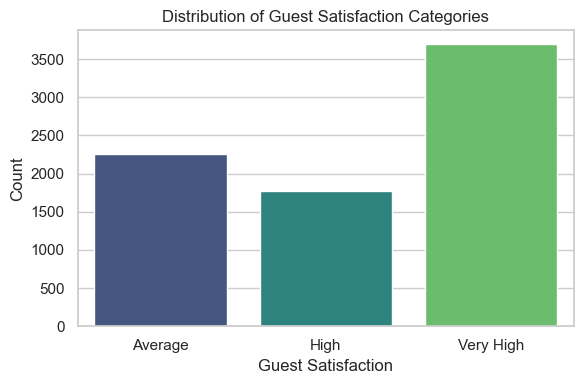

In [41]:
plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='guest_satisfaction', order=['Average', 'High', 'Very High'], palette='viridis')
plt.title('Distribution of Guest Satisfaction Categories')
plt.xlabel('Guest Satisfaction')
plt.ylabel('Count')
plt.tight_layout()
plt.show()


In [42]:
manual_mapping = {
    'Average': 0,
    'High': 1,
    'Very High': 2
}

df['guest_satisfaction'] = df['guest_satisfaction'].map(manual_mapping)


In [43]:
df[target_col].value_counts()


guest_satisfaction
2    3692
0    2260
1    1772
Name: count, dtype: int64

# Drop Unnecessary columns

In [44]:
url_cols = ['listing_url', 'host_url']

cols_to_drop = id_cols + url_cols
df.drop(cols_to_drop, axis = 1 , inplace = True)

# Feature Extraction

In [45]:
# 7. Date columns preprocessing
for col in date_cols:
    if col in df.columns:
        df[col] = pd.to_datetime(df[col], errors='coerce')

# Create features from dates
reference_date = pd.Timestamp('2025-01-01')  # Use a fixed reference date for consistency
for col in date_cols:
    if col in df.columns:
        df[f'{col}_days'] = (reference_date - df[col]).dt.days

        # Extract month and year as cyclical features
        if not df[col].isna().all():
            df[f'{col}_month_sin'] = np.sin(2 * np.pi * df[col].dt.month / 12)
            df[f'{col}_month_cos'] = np.cos(2 * np.pi * df[col].dt.month / 12)
            df[f'{col}_year'] = df[col].dt.year

        # Drop original date columns
        df = df.drop(col, axis=1)


# Handle some Location Columns with Clustering "KMeans"

In [46]:
# 8.2 Location clustering باستخدام HDBSCAN
# if 'latitude' in df.columns and 'longitude' in df.columns:
#     print("Creating location clusters using HDBSCAN...")

#     coords = df[['latitude', 'longitude']].dropna()

#     # من الأفضل نعمل scaling للإحداثيات قبل الـ clustering
#     scaler = StandardScaler()
#     coords_scaled = scaler.fit_transform(coords)

#     # تطبيق HDBSCAN
#     clusterer = hdbscan.HDBSCAN(min_cluster_size=10)  # تقدر تغير الرقم حسب عدد الداتا عندك
#     cluster_labels = clusterer.fit_predict(coords_scaled)

#     # نرجّع labels للـ dataframe الأصلي
#     df.loc[coords.index, 'location_cluster'] = cluster_labels

#     # التعامل مع النقاط اللي مالهاش cluster (label = -1)
#     df['location_cluster'] = df['location_cluster'].fillna(-1).astype(int)

#     # نحسب المسافة من مركز المدينة (قبل ما نحذف الإحداثيات)
#     city_center = df[['latitude', 'longitude']].mean()
#     df['distance_to_center'] = np.sqrt(
#         (df['latitude'] - city_center['latitude'])**2 +
#         (df['longitude'] - city_center['longitude'])**2
#     )

#     # One-hot encode location clusters (مع تجاهل -1 لأنه outlier غالبًا)
#     df = pd.get_dummies(df, columns=['location_cluster'], prefix='loc_cluster')

#     # نحذف الإحداثيات الأصلية
#     #df = df.drop(['latitude', 'longitude'], axis=1)




# 8.2 Location clustering
if 'latitude' in df.columns and 'longitude' in df.columns:
    print("Creating location clusters...")
    coords = df[['latitude', 'longitude']].dropna()

    # Determine optimal number of clusters using silhouette score
    from sklearn.metrics import silhouette_score

    sil_scores = []
    k_range = range(3, 15)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=RANDOM_STATE)
        labels = kmeans.fit_predict(coords)
        sil_score = silhouette_score(coords, labels)
        sil_scores.append(sil_score)

    best_k = k_range[np.argmax(sil_scores)]
    print(f"Best number of location clusters: {best_k}")

    # Create clusters with optimal k
    kmeans = KMeans(n_clusters=best_k, random_state=RANDOM_STATE)
    df['location_cluster'] = kmeans.fit_predict(df[['latitude', 'longitude']])

    # Create distance to center features
    city_center = df[['latitude', 'longitude']].mean()
    df['distance_to_center'] = np.sqrt(
        (df['latitude'] - city_center['latitude'])**2 +
        (df['longitude'] - city_center['longitude'])**2
    )

    # One-hot encode location clusters
    df = pd.get_dummies(df, columns=['location_cluster'], prefix='loc_cluster')

    # Drop original coordinates
    #df = df.drop(['latitude', 'longitude'], axis=1)


Creating location clusters...
Best number of location clusters: 3


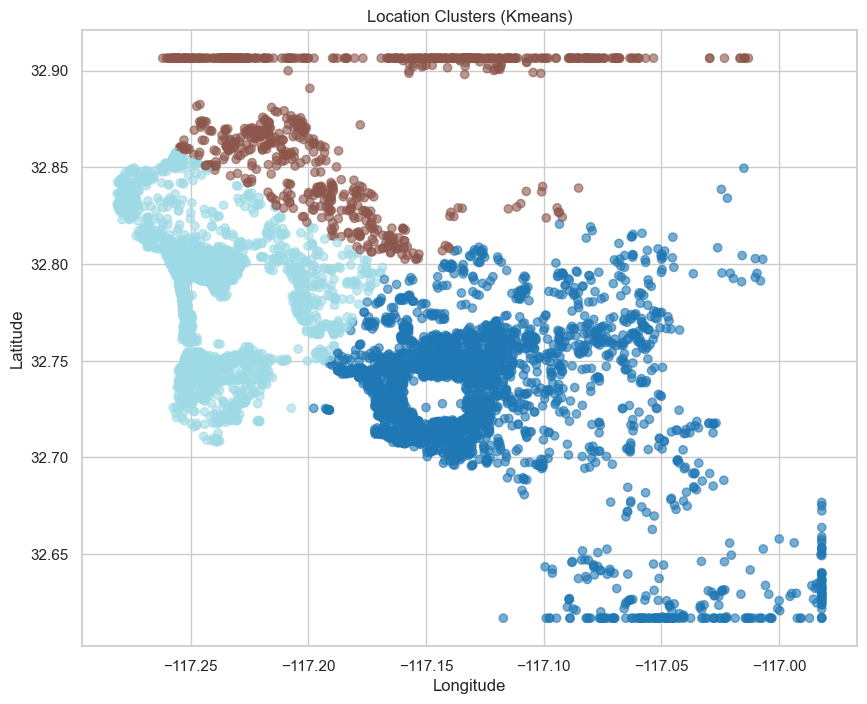

In [47]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    df['longitude'],
    df['latitude'],
    c=df.filter(like='loc_cluster_').idxmax(axis=1).str.extract('(\d+)').astype(int),
    cmap='tab20',
    alpha=0.6
)

plt.title('Location Clusters (Kmeans)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()


In [48]:
import folium
from folium.plugins import MarkerCluster
import random

df_with_coords = df.copy()
df_with_coords[['latitude', 'longitude']] = coords

map_center = [coords['latitude'].mean(), coords['longitude'].mean()]
map_clusters = folium.Map(location=map_center, zoom_start=12)

unique_clusters = sorted(df_with_coords.filter(like='loc_cluster_').idxmax(axis=1).str.extract('(\d+)')[0].astype(int).unique())
colors = plt.cm.tab20.colors
color_dict = {
    cluster: f"#{int(r*255):02x}{int(g*255):02x}{int(b*255):02x}"
    for cluster, (r, g, b) in zip(unique_clusters, colors)
}

for i, row in df_with_coords.iterrows():
    cluster = int(row.filter(like='loc_cluster_').idxmax().split('_')[-1])
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color=color_dict.get(cluster, '#000000'),
        fill=True,
        fill_color=color_dict.get(cluster, '#000000'),
        fill_opacity=0.7
    ).add_to(map_clusters)

map_clusters


In [49]:
df = df.drop(['latitude', 'longitude'], axis=1)

# Handle Text columns with "NLP"

In [50]:
import pandas as pd
import re
import string
from nltk.sentiment import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import TfidfVectorizer
from joblib import Parallel, delayed
import joblib
import os
import swifter

# Initialize sentiment analyzer
sia = SentimentIntensityAnalyzer()

def process_text(text):
    if pd.isna(text):
        return {
            'word_count': 0,
            'sentiment_compound': 0,
            'sentiment_pos': 0,
            'sentiment_neg': 0,
            'sentiment_neu': 0
        }

    # Clean text
    text = str(text).lower()
    text = re.sub(r'\d+', '', text)  # Remove numbers
    text = text.translate(str.maketrans('', '', string.punctuation))

    # Count words
    word_count = len(text.split())

    # Get sentiment
    sentiment = sia.polarity_scores(text)

    return {
        'word_count': word_count,
        'sentiment_compound': sentiment['compound'],
        'sentiment_pos': sentiment['pos'],
        'sentiment_neg': sentiment['neg'],
        'sentiment_neu': sentiment['neu']
    }

# Function to process text columns in parallel and extract sentiment features

def process_column(df, col):
    print(f"  Processing {col}...")
    text_features = df[col].swifter.apply(process_text)  # Using swifter to parallelize the apply method

    # Convert list of dicts to dataframe
    text_features_df = pd.DataFrame(text_features.tolist())

    # Add column prefix
    text_features_df.columns = [f"{col}_{feat}" for feat in text_features_df.columns]
   
    return text_features_df

def apply_tfidf(df, col, max_features=20):
    MODEL_DIR = "mo"
    os.makedirs(MODEL_DIR, exist_ok=True)
    print(f"Applying TF-IDF on: {col}")
    tfidf = TfidfVectorizer(max_features=max_features, stop_words='english')

    # Fill NaNs with empty strings and apply TF-IDF
    tfidf_matrix = tfidf.fit_transform(df[col].fillna(""))

    # Create a DataFrame from TF-IDF matrix
    tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=[f"{col}_tfidf_{feat}" for feat in tfidf.get_feature_names_out()])
    joblib.dump(tfidf, os.path.join(MODEL_DIR, f"{col}_tfidf_vectorizer.joblib"))
    # Save column names
    joblib.dump(list(tfidf_df.columns), os.path.join(MODEL_DIR, f"{col}_tfidf_columns.joblib"))
    return tfidf_df

# Process each text column for sentiment analysis and word count
for col in text_cols:
    if col in df.columns:
        # Process text column for sentiment and word count
        text_features_df = process_column(df, col)

        # Add sentiment features to main dataframe
        df = pd.concat([df, text_features_df], axis=1)

        # Apply TF-IDF on the text column
        tfidf_df = apply_tfidf(df, col)

        # Add TF-IDF features to main dataframe
        df = pd.concat([df, tfidf_df], axis=1)

        # Drop original text column (optional)
        df = df.drop(col, axis=1)



  Processing name...


Pandas Apply:   0%|          | 0/7724 [00:00<?, ?it/s]

Applying TF-IDF on: name
  Processing summary...


Pandas Apply:   0%|          | 0/7724 [00:00<?, ?it/s]

Applying TF-IDF on: summary
  Processing space...


Pandas Apply:   0%|          | 0/7724 [00:00<?, ?it/s]

Applying TF-IDF on: space
  Processing description...


Pandas Apply:   0%|          | 0/7724 [00:00<?, ?it/s]

Applying TF-IDF on: description
  Processing neighborhood_overview...


Pandas Apply:   0%|          | 0/7724 [00:00<?, ?it/s]

Applying TF-IDF on: neighborhood_overview
  Processing notes...


Pandas Apply:   0%|          | 0/7724 [00:00<?, ?it/s]

Applying TF-IDF on: notes
  Processing transit...


Pandas Apply:   0%|          | 0/7724 [00:00<?, ?it/s]

Applying TF-IDF on: transit
  Processing access...


Pandas Apply:   0%|          | 0/7724 [00:00<?, ?it/s]

Applying TF-IDF on: access
  Processing interaction...


Pandas Apply:   0%|          | 0/7724 [00:00<?, ?it/s]

Applying TF-IDF on: interaction
  Processing house_rules...


Pandas Apply:   0%|          | 0/7724 [00:00<?, ?it/s]

Applying TF-IDF on: house_rules
  Processing host_about...


Pandas Apply:   0%|          | 0/7724 [00:00<?, ?it/s]

Applying TF-IDF on: host_about


In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7724 entries, 0 to 7723
Columns: 364 entries, host_name to host_about_tfidf_years
dtypes: bool(3), float64(313), int32(4), int64(17), object(27)
memory usage: 21.2+ MB


In [52]:
sentiment_cols = df.columns[df.columns.str.contains('sentiment')]
print(df[sentiment_cols].describe())


       name_sentiment_compound  name_sentiment_pos  name_sentiment_neg  \
count              7724.000000         7724.000000         7724.000000   
mean                  0.174684            0.150922            0.010389   
std                   0.275687            0.217635            0.054147   
min                  -0.659700            0.000000            0.000000   
25%                   0.000000            0.000000            0.000000   
50%                   0.000000            0.000000            0.000000   
75%                   0.440400            0.348000            0.000000   
max                   0.902200            0.884000            0.688000   

       name_sentiment_neu  summary_sentiment_compound  summary_sentiment_pos  \
count         7724.000000                 7724.000000            7724.000000   
mean             0.838690                    0.715342               0.162361   
std              0.219641                    0.323432               0.093336   
min          

Text(0.5, 1.0, 'Distribution of Sentiment (Compound) in interaction')

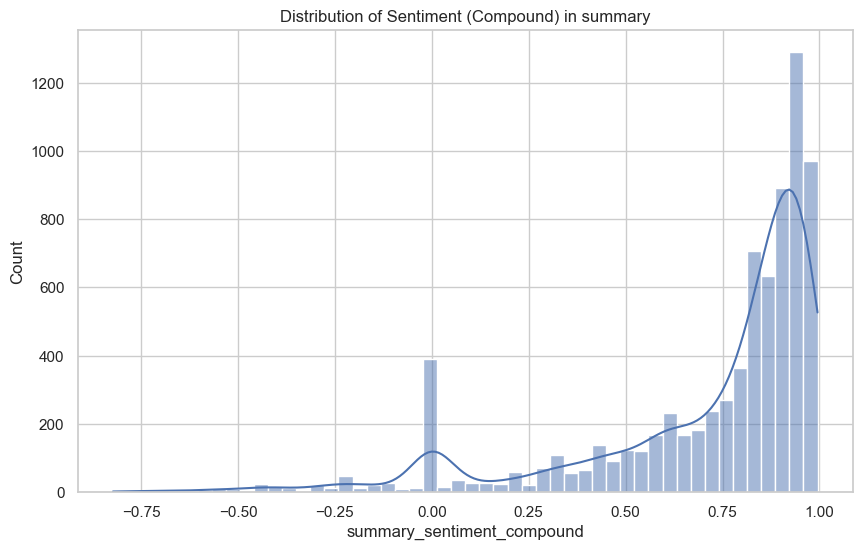

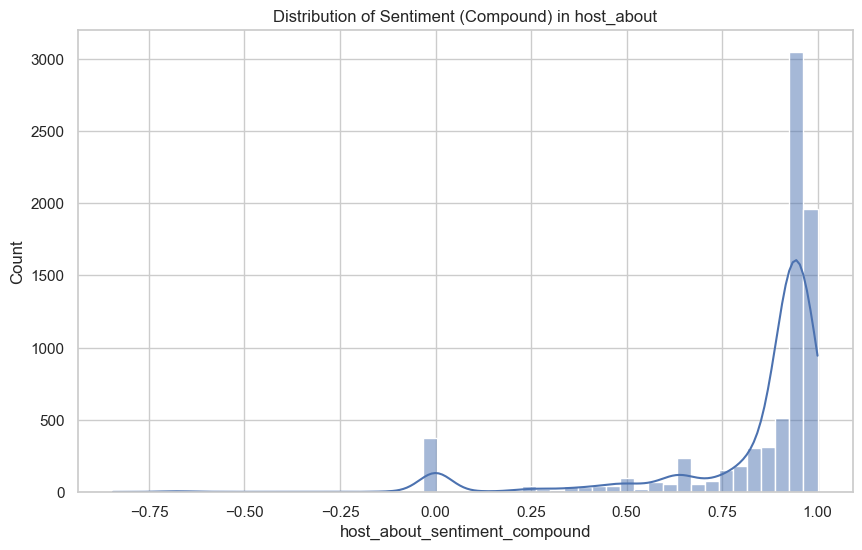

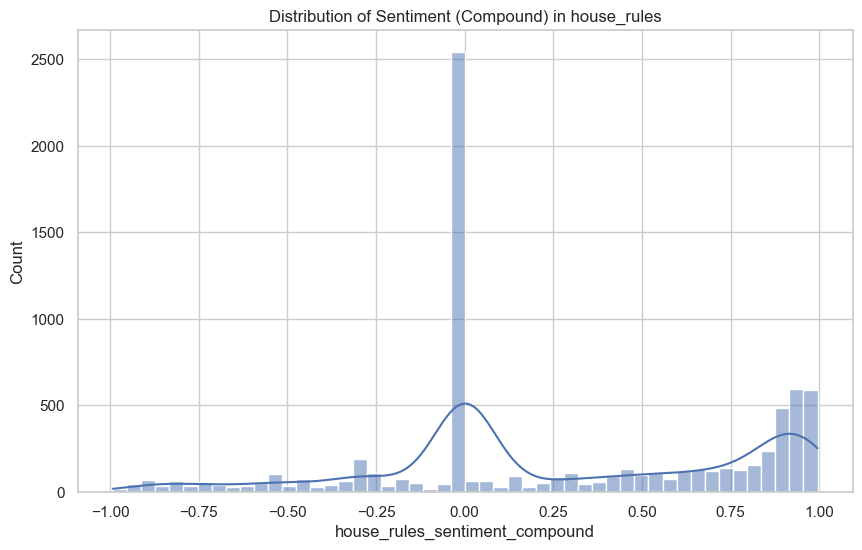

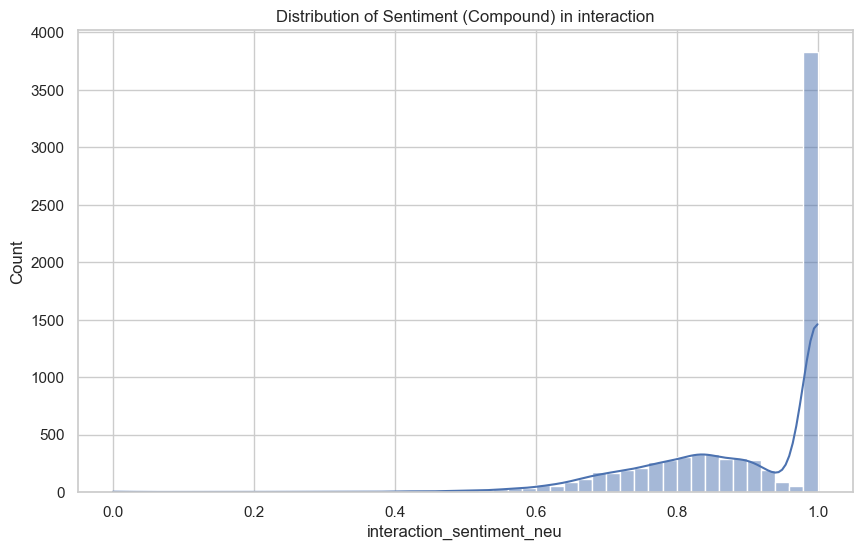

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
sns.histplot(df['summary_sentiment_compound'], bins=50, kde=True)
plt.title("Distribution of Sentiment (Compound) in summary")
plt.figure(figsize=(10,6))
sns.histplot(df['host_about_sentiment_compound'], bins=50, kde=True)
plt.title("Distribution of Sentiment (Compound) in host_about")
plt.figure(figsize=(10,6))
sns.histplot(df['house_rules_sentiment_compound'], bins=50, kde=True)
plt.title("Distribution of Sentiment (Compound) in house_rules")
plt.figure(figsize=(10,6))
sns.histplot(df['interaction_sentiment_neu'], bins=50, kde=True)
plt.title("Distribution of Sentiment (Compound) in interaction")


In [54]:
df['host_sentiment_label'] = df['host_about_sentiment_compound'].apply(
    lambda x: 'positive' if x > 0.5 else 'neutral' if x > 0 else 'negative'
)


Text(0.5, 1.0, 'Relationship between Host Sentiment and Price')

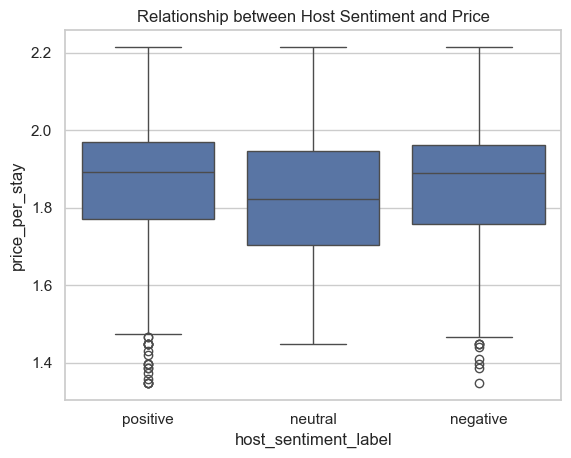

In [55]:
sns.boxplot(data=df, x='host_sentiment_label', y='price_per_stay')
plt.title("Relationship between Host Sentiment and Price")


In [56]:
df['overall_sentiment_score'] = (
    df[['summary_sentiment_compound', 'space_sentiment_compound', 'host_about_sentiment_compound']].mean(axis=1)
)


In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7724 entries, 0 to 7723
Columns: 366 entries, host_name to overall_sentiment_score
dtypes: bool(3), float64(314), int32(4), int64(17), object(28)
memory usage: 21.3+ MB


In [58]:
cols_to_drop = [
    col for col in df.columns
    if col.endswith('_sentiment_neg') or
       col.endswith('_sentiment_neu') or
       col.startswith('name_sentiment')
]
df.drop(columns=cols_to_drop, inplace=True)


In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7724 entries, 0 to 7723
Columns: 342 entries, host_name to overall_sentiment_score
dtypes: bool(3), float64(290), int32(4), int64(17), object(28)
memory usage: 19.9+ MB


In [60]:
important_sentiment_cols = [
    'summary_sentiment_compound',
    'space_sentiment_compound',
    'host_about_sentiment_compound',
    'house_rules_sentiment_compound',
    'interaction_sentiment_compound'
]

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns

# تأكد إننا عندنا العمود اللي اتعمله encoding
if 'guest_satisfaction_encoded' in df.columns:
    for col in important_sentiment_cols:
        # Scatter plot
        plt.figure(figsize=(6, 4))
        sns.stripplot(data=df, x='guest_satisfaction_encoded', y=col, alpha=0.3, jitter=True)
        plt.title(f'{col} vs Guest Satisfaction')
        plt.xlabel('Guest Satisfaction (Encoded)')
        plt.ylabel(col)
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    # Correlation table
    correlation = df[important_sentiment_cols + ['guest_satisfaction_encoded']].corr()
    print("\n📊 Correlation with Guest Satisfaction Encoded:\n")
    print(correlation['guest_satisfaction_encoded'].sort_values(ascending=False))


In [62]:
cols_to_drop = [
    'space_sentiment_compound',
    'house_rules_sentiment_compound'
]
df = df.drop(columns=cols_to_drop)


In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7724 entries, 0 to 7723
Columns: 340 entries, host_name to overall_sentiment_score
dtypes: bool(3), float64(288), int32(4), int64(17), object(28)
memory usage: 19.8+ MB


# Feature Engineering

In [64]:
# Interaction between accommodates and bedrooms
if 'accommodates' in df.columns and 'bedrooms' in df.columns:
    df['person_per_bedroom'] = df['accommodates'] / (df['bedrooms'] + 0.1)  # Add 0.1 to avoid division by zero

# Interaction between price and accommodates
if 'nightly_price' in df.columns and 'accommodates' in df.columns:
    df['price_per_person'] = df['nightly_price'] / (df['accommodates'] + 0.1)

# Interaction between reviews and host features
if 'number_of_reviews' in df.columns and 'host_is_superhost' in df.columns:
    # Convert binary text values to numeric if needed
    if df['host_is_superhost'].dtype == 'object':
        df['host_is_superhost'] = df['host_is_superhost'].map({'t': 1, 'f': 0})

    df['superhost_review_interaction'] = df['host_is_superhost'] * df['number_of_reviews']


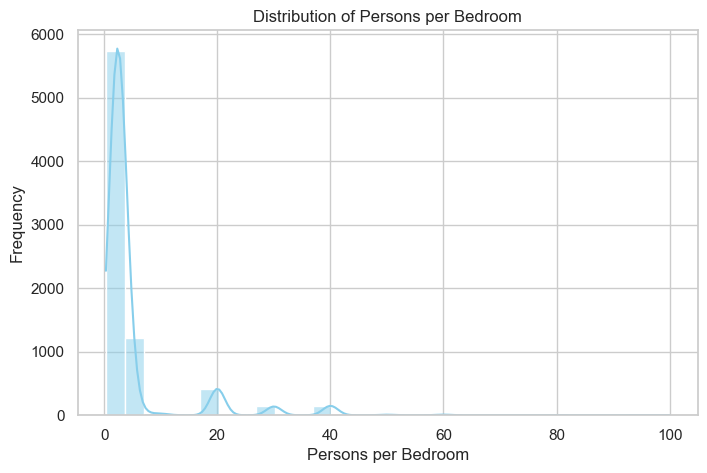

In [65]:
plt.figure(figsize=(8, 5))
sns.histplot(df['person_per_bedroom'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Persons per Bedroom')
plt.xlabel('Persons per Bedroom')
plt.ylabel('Frequency')
plt.show()


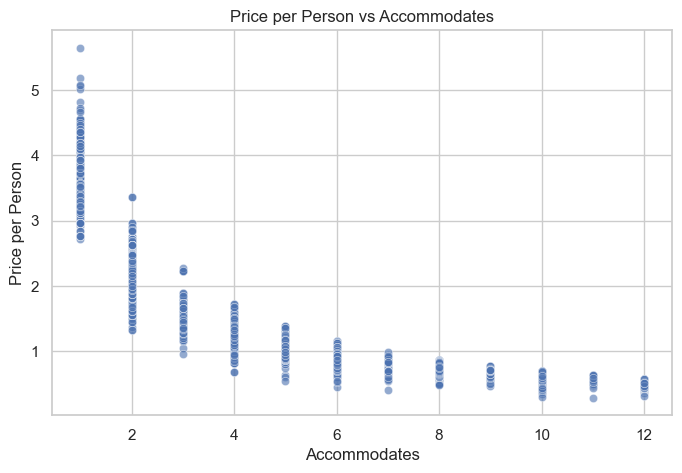

In [66]:
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='accommodates', y='price_per_person', alpha=0.6)
plt.title('Price per Person vs Accommodates')
plt.xlabel('Accommodates')
plt.ylabel('Price per Person')
plt.show()


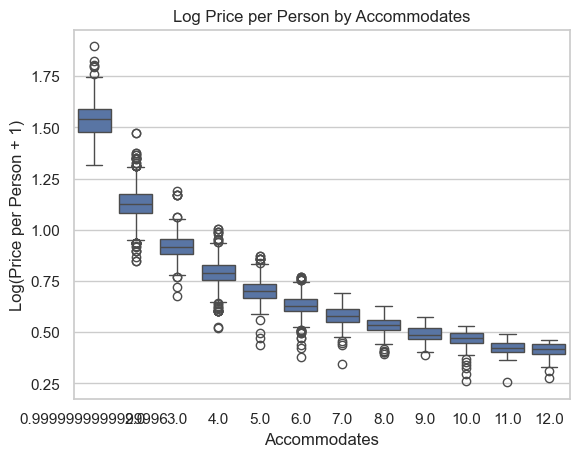

In [67]:
df['price_per_person'] = np.log1p(df['price_per_person'])

sns.boxplot(x='accommodates', y='price_per_person', data=df)
plt.title('Log Price per Person by Accommodates')
plt.xlabel('Accommodates')
plt.ylabel('Log(Price per Person + 1)')
plt.show()


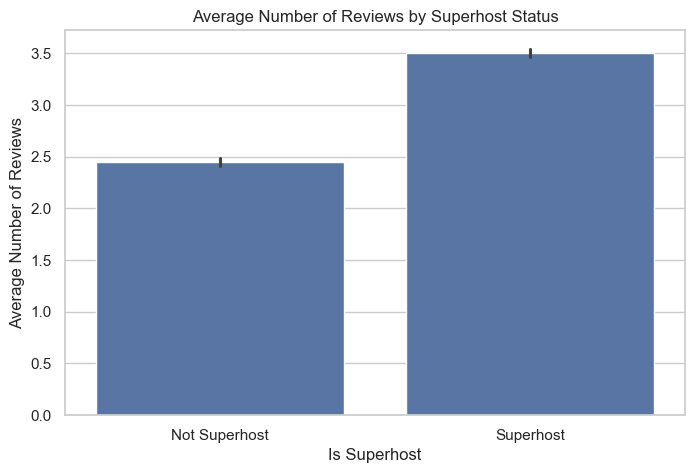

In [68]:
plt.figure(figsize=(8, 5))
sns.barplot(x='host_is_superhost', y='number_of_reviews', data=df)
plt.title('Average Number of Reviews by Superhost Status')
plt.xlabel('Is Superhost')
plt.ylabel('Average Number of Reviews')
plt.xticks([0, 1], ['Not Superhost', 'Superhost'])
plt.show()


# Handle amenities column

In [69]:
# 8.4 Process amenities
if 'amenities' in df.columns:
    print("Processing amenities...")
    df['amenities'] = df['amenities'].astype(str).str.lower()

    # Clean and extract amenities
    def clean_amenities(amenities_str):
        amenities_str = amenities_str.strip('{}')
        return {item.strip().strip('"').strip("'") for item in amenities_str.split(',') if item.strip()}

    df['amenities_set'] = df['amenities'].apply(clean_amenities)

    # Count amenities
    df['amenities_count'] = df['amenities_set'].apply(len)

    # Check for important amenities
    important_amenities = [
        'wifi', 'internet', 'kitchen', 'washer', 'dryer', 'dishwasher',
        'air conditioning', 'heating', 'tv', 'pool', 'gym', 'free parking',
        'breakfast', 'wheelchair', 'elevator', 'hot tub', 'workspace'
    ]

    for amenity in important_amenities:
        df[f'has_{amenity.replace(" ", "_")}'] = df['amenities_set'].apply(
            lambda x: any(amenity in item for item in x)
        ).astype(int)

    # Create amenity score based on TF-IDF concept
    flat_list = [item for sublist in df['amenities_set'] for item in sublist]
    from collections import Counter
    word_counts = Counter(flat_list)

    # Calculate inverse frequency - rare amenities get higher scores
    total_listings = len(df)
    word_rates = {word: np.log(total_listings / count) for word, count in word_counts.items()}

    # Calculate amenity score for each listing
    df['amenity_score'] = df['amenities_set'].apply(lambda s: sum(word_rates.get(w, 0) for w in s))

    # Drop intermediate columns
    df = df.drop(['amenities', 'amenities_set'], axis=1)


Processing amenities...


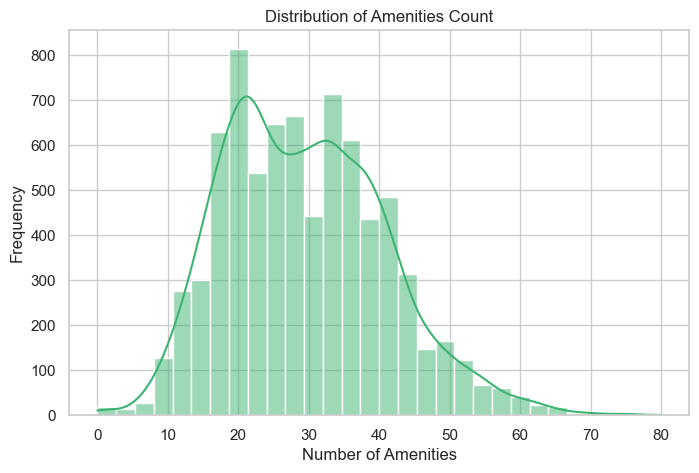

In [70]:
plt.figure(figsize=(8, 5))
sns.histplot(df['amenities_count'], bins=30, kde=True, color='mediumseagreen')
plt.title('Distribution of Amenities Count')
plt.xlabel('Number of Amenities')
plt.ylabel('Frequency')
plt.show()



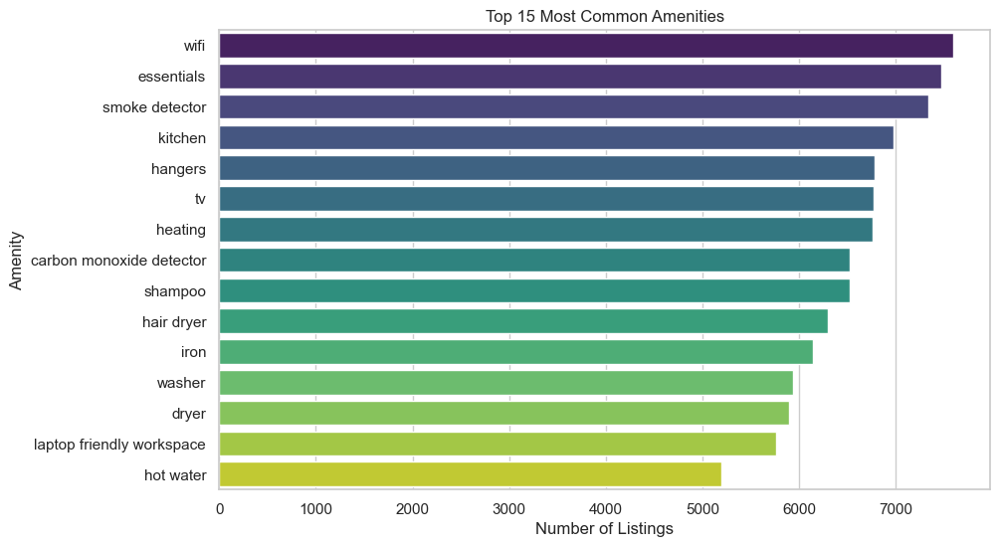

In [71]:
common_amenities = pd.Series(flat_list).value_counts().head(15)

plt.figure(figsize=(10, 6))
sns.barplot(x=common_amenities.values, y=common_amenities.index, palette='viridis')
plt.title('Top 15 Most Common Amenities')
plt.xlabel('Number of Listings')
plt.ylabel('Amenity')
plt.show()


In [72]:
if 'review_scores_rating' in df.columns:
    plt.figure(figsize=(8, 5))
    sns.scatterplot(x='amenity_score', y='review_scores_rating', data=df, alpha=0.6)
    plt.title('Amenity Score vs Review Rating')
    plt.xlabel('Amenity Score')
    plt.ylabel('Review Score')
    plt.show()


In [73]:
# important_amenities_viz = ['wifi', 'kitchen', 'washer', 'air_conditioning', 'tv', 'pool']
important_amenities_viz = ['wifi','essential', 'kitchen', 'hair dryer', 'shampoo', 'tv', 'smoke detector','heating']

for amenity in important_amenities_viz:
    col = f'has_{amenity}'
    if col in df.columns and 'review_scores_rating' in df.columns:
        plt.figure(figsize=(6, 4))
        sns.boxplot(x=col, y='review_scores_rating', data=df)
        plt.title(f'Review Score by Presence of {amenity.replace("_", " ").title()}')
        plt.xlabel(amenity.replace("_", " ").title())
        plt.ylabel('Review Score')
        plt.xticks([0, 1], ['No', 'Yes'])
        plt.show()


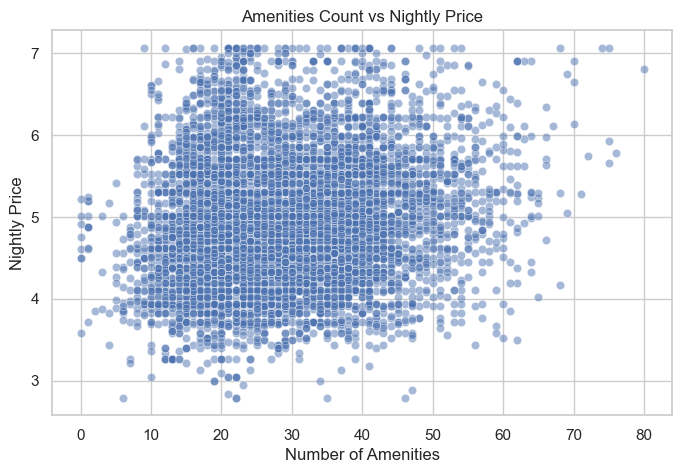

In [74]:
if 'nightly_price' in df.columns:
    plt.figure(figsize=(8, 5))
    sns.scatterplot(x='amenities_count', y='nightly_price', data=df, alpha=0.5)
    plt.title('Amenities Count vs Nightly Price')
    plt.xlabel('Number of Amenities')
    plt.ylabel('Nightly Price')
    plt.show()


# Handle Property_type Column

In [75]:
# 8.5 Property type grouping
if 'property_type' in df.columns:
    print("Grouping property types...")
    property_groups = {
        'Apartments': ['Apartment', 'Condominium', 'Loft', 'Serviced apartment', 'Aparthotel'],
        'Houses': ['House', 'Villa', 'Townhouse', 'Vacation home'],
        'Small_Accommodations': ['Bungalow', 'Cottage', 'Tiny house', 'Earth house'],
        'Unique_Stays': ['Treehouse', 'Boat', 'Castle', 'Cave', 'Igloo', 'Bus', 'Dome house', 'Tent'],
        'Hosted_Stays': ['Guest suite', 'Guesthouse', 'Bed and breakfast', 'Hostel', 'Boutique hotel', 'Hotel'],
        'Nature_Stays': ['Camper/RV', 'Campsite', 'Farm stay', 'Cabin', 'Chalet', 'Nature lodge'],
        'Other': ['Other', 'Resort', 'Casa particular (Cuba)']
    }

    def map_property_type(prop_type):
        for group, types in property_groups.items():
            if any(t.lower() in prop_type.lower() for t in types):
                return group
        return 'Other'

    df['property_type_grouped'] = df['property_type'].apply(map_property_type)

    property_rating_mean = df.groupby('property_type_grouped')['guest_satisfaction'].mean()

    df['property_type_encoded'] = df['property_type_grouped'].map(property_rating_mean)

    df.drop(['property_type', 'property_type_grouped'], axis=1, inplace=True)

Grouping property types...


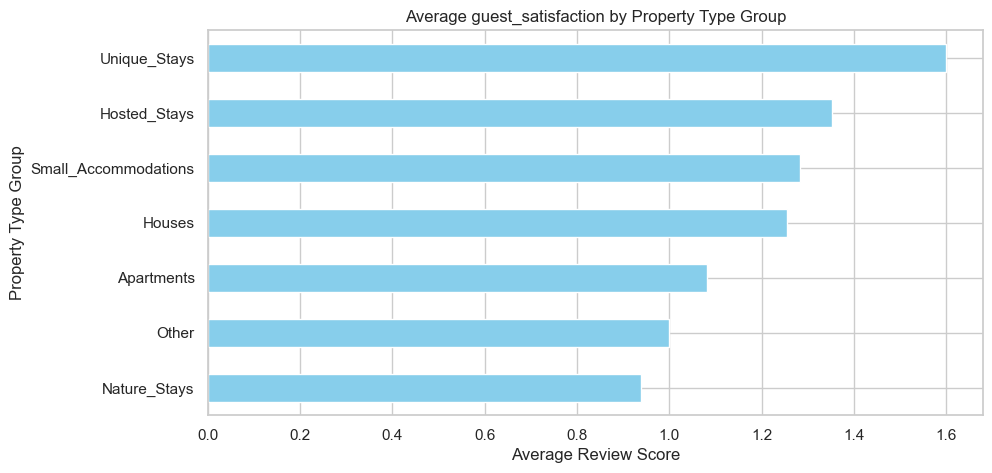

In [76]:
plt.figure(figsize=(10, 5))
property_rating_mean.sort_values().plot(kind='barh', color='skyblue')
plt.title('Average guest_satisfaction by Property Type Group')
plt.xlabel('Average Review Score')
plt.ylabel('Property Type Group')
plt.show()


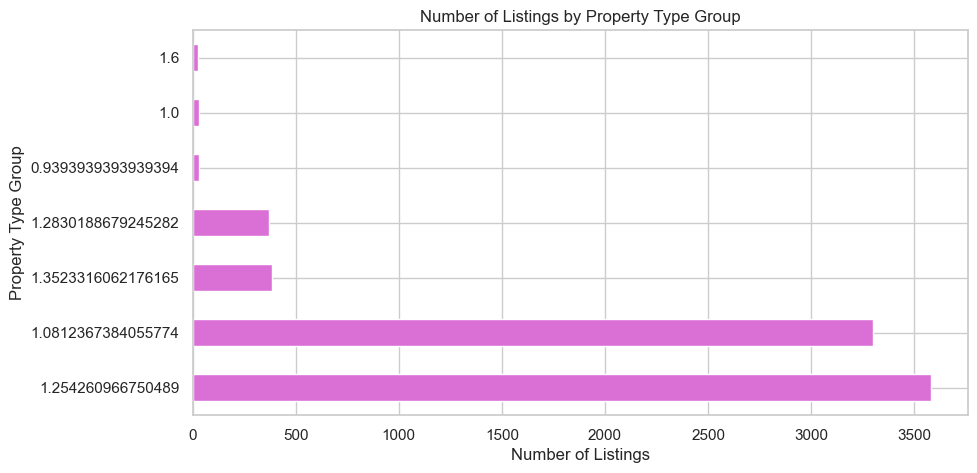

In [77]:
counts = df['property_type_encoded'].value_counts()

plt.figure(figsize=(10, 5))
counts.plot(kind='barh', color='orchid')
plt.title('Number of Listings by Property Type Group')
plt.xlabel('Number of Listings')
plt.ylabel('Property Type Group')
plt.show()

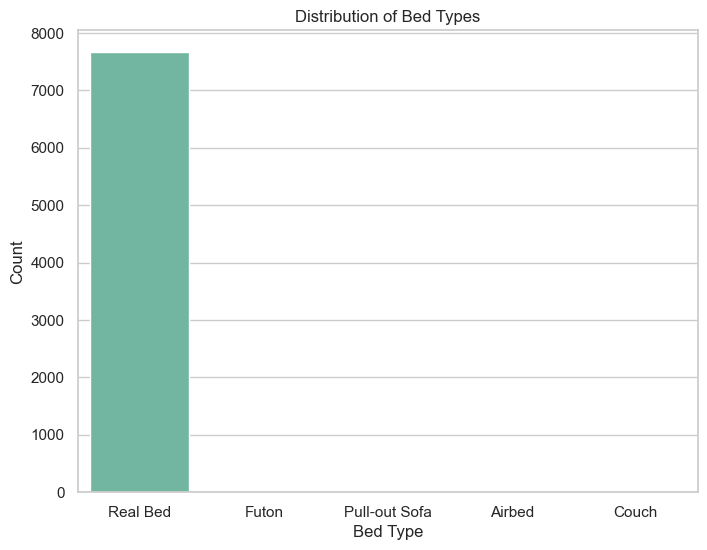

In [78]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='bed_type', palette='Set2')
plt.title('Distribution of Bed Types')
plt.xlabel('Bed Type')
plt.ylabel('Count')
plt.show()

In [79]:
# 8.6 Bed type processing
if 'bed_type' in df.columns:
    print("Processing bed types...")
    # Simplify to Real Bed vs Other
    df['bed_type'] = df['bed_type'].apply(lambda x: x if x == 'Real Bed' else 'Other')
    df = pd.get_dummies(df, columns=['bed_type'], prefix='bed', drop_first=True)


Processing bed types...


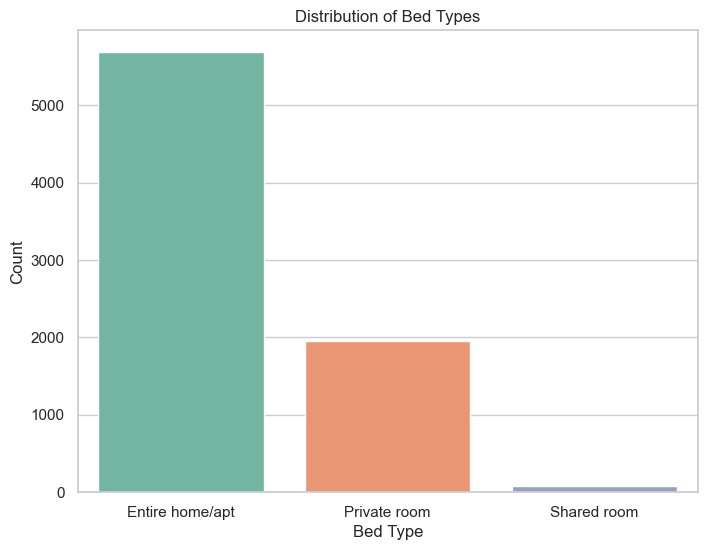

In [80]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='room_type', palette='Set2')
plt.title('Distribution of Bed Types')
plt.xlabel('Bed Type')
plt.ylabel('Count')
plt.show()

In [81]:
# 8.7 Room type processing
if 'room_type' in df.columns:
    print("Processing room types...")
    df = pd.get_dummies(df, columns=['room_type'], prefix='room', drop_first=True)

Processing room types...


In [82]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7724 entries, 0 to 7723
Columns: 361 entries, host_name to room_Shared room
dtypes: bool(6), float64(292), int32(21), int64(18), object(24)
memory usage: 20.3+ MB


In [83]:
# 8.8 Convert binary columns
binary_cols = ['host_is_superhost','host_has_profile_pic', 'host_identity_verified',
               'is_location_exact', 'instant_bookable',
               'require_guest_profile_picture', 'require_guest_phone_verification',
               'requires_license', 'is_business_travel_ready']

df[binary_cols].nunique()

host_is_superhost                   2
host_has_profile_pic                2
host_identity_verified              2
is_location_exact                   2
instant_bookable                    2
require_guest_profile_picture       2
require_guest_phone_verification    2
requires_license                    1
is_business_travel_ready            1
dtype: int64

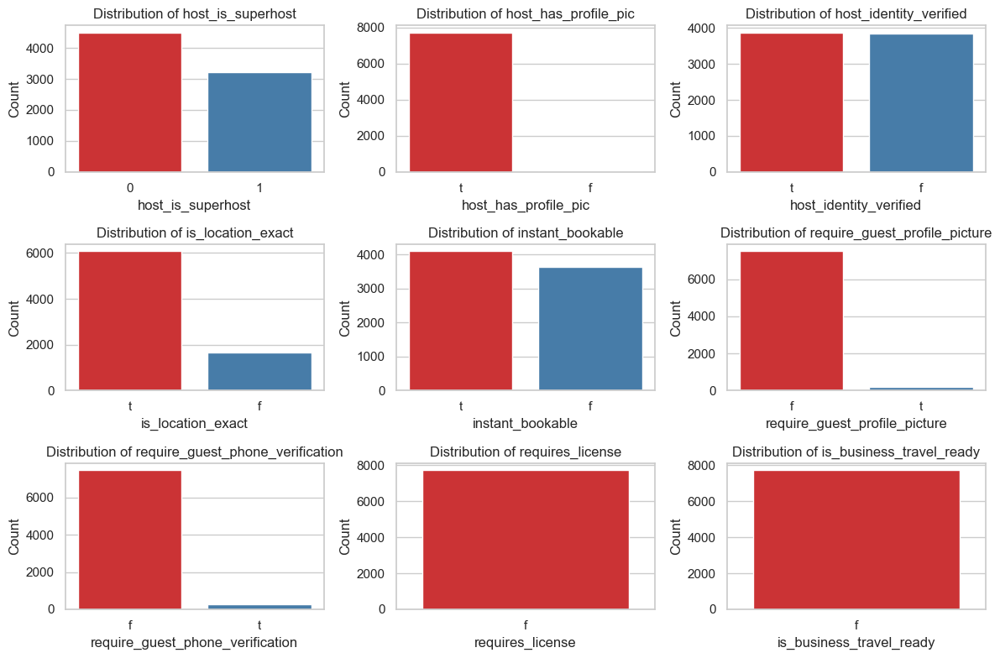

In [84]:

binary_cols = ['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified',
               'is_location_exact', 'instant_bookable',
               'require_guest_profile_picture', 'require_guest_phone_verification',
               'requires_license', 'is_business_travel_ready']

plt.figure(figsize=(12, 8))
for i, col in enumerate(binary_cols, 1):
    plt.subplot(3, 3, i)
    sns.countplot(data=df, x=col, palette='Set1')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')

plt.tight_layout()
plt.show()


In [85]:
df.drop(['host_has_profile_pic', 'require_guest_profile_picture','require_guest_phone_verification','requires_license','is_business_travel_ready' ], axis=1, inplace=True)

In [86]:
binary_cols = ['host_is_superhost',  'host_identity_verified',
               'is_location_exact', 'instant_bookable']
for col in binary_cols:
    if col in df.columns:
        if df[col].dtype == 'object':
            df[col] = df[col].map({'t': 1, 'f': 0})


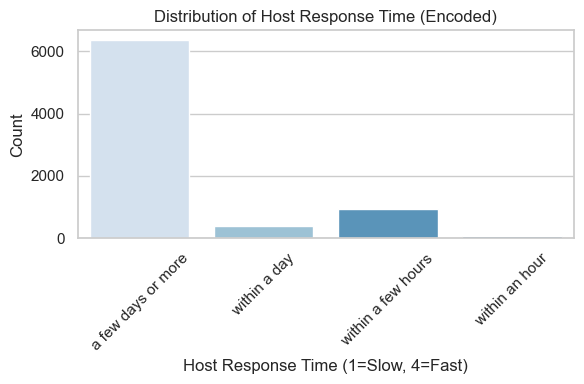

In [87]:
import matplotlib.pyplot as plt
import seaborn as sns

if 'host_response_time' in df.columns:
    plt.figure(figsize=(6, 4))
    sns.countplot(data=df, x='host_response_time', palette='Blues')

    plt.title('Distribution of Host Response Time (Encoded)')
    plt.xlabel('Host Response Time (1=Slow, 4=Fast)')
    plt.ylabel('Count')
    plt.xticks(ticks=[0, 1, 2, 3], labels=['a few days or more', 'within a day', 'within a few hours', 'within an hour'], rotation=45)
    plt.tight_layout()
    plt.show()


In [88]:
# 8.9 Host response time mapping
if 'host_response_time' in df.columns and df['host_response_time'].dtype == 'object':
    response_time_mapping = {
        'within an hour': 4,      # Fast response (highest score)
        'within a few hours': 3,  # Good response
        'within a day': 2,        # Moderate response
        'a few days or more': 1   # Slow response (lowest score)
    }
    df['host_response_time'] = df['host_response_time'].map(response_time_mapping)


In [89]:
# 8.10 City name standardization
if 'city' in df.columns:
    print("Standardizing city names...")
    df['city'] = df['city'].str.lower().str.strip()

    # Group common variations of San Diego
    san_diego_patterns = ['san diego', 'san deigo', 'san diego,', 'gas lamp']
    df['is_san_diego'] = df['city'].apply(
        lambda x: 1 if any(pattern in str(x).lower() for pattern in san_diego_patterns) else 0
    )

    # Group La Jolla
    df['is_la_jolla'] = df['city'].apply(
        lambda x: 1 if 'la jolla' in str(x).lower() else 0
    )

    # Drop original city column
    df = df.drop('city', axis=1)


Standardizing city names...


In [90]:
cat_col = df.select_dtypes(include='object').columns
cat_col

Index(['host_name', 'host_location', 'host_neighbourhood', 'street',
       'neighbourhood', 'neighbourhood_cleansed', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'cancellation_policy',
       'host_sentiment_label'],
      dtype='object')

In [91]:
df['cancellation_policy'].unique()

array(['moderate', 'strict_14_with_grace_period', 'flexible',
       'super_strict_60', 'strict', 'super_strict_30'], dtype=object)

In [92]:
# Price-related ratios
if all(col in df.columns for col in ['price_per_stay', 'nightly_price', 'cleaning_fee']):
    df['price_to_nightly_ratio'] = df['price_per_stay'] / (df['nightly_price'] + 0.001)  # Avoid division by zero
    df['cleaning_to_nightly_ratio'] = df['cleaning_fee'] / (df['nightly_price'] + 0.001)

# Guest-related ratios
if all(col in df.columns for col in ['accommodates', 'guests_included', 'bedrooms', 'bathrooms']):
    df['price_per_guest'] = df['nightly_price'] / (df['accommodates'] + 0.001)
    df['beds_per_guest'] = df['beds'] / (df['accommodates'] + 0.001)
    df['baths_per_guest'] = df['bathrooms'] / (df['accommodates'] + 0.001)
    df['guests_to_bedrooms'] = df['accommodates'] / (df['bedrooms'] + 0.001)

# Reviews-related ratios
if all(col in df.columns for col in ['number_of_reviews', 'number_of_stays']):
    df['review_rate'] = df['number_of_reviews'] / (df['number_of_stays'] + 0.001)

# 9. Remove high cardinality categorical columns
high_cardinality_cols = ['host_location', 'host_neighbourhood', 'country', 'city', 'street',
                         'neighbourhood', 'neighbourhood_cleansed', 'zipcode', 'market', 'smart_location']

for col in high_cardinality_cols:
    if col in df.columns:
        df = df.drop(col, axis=1)

# Other Encoding

In [93]:
# 8.11 Cleanup remaining categorical columns
cat_cols = df.select_dtypes(include=['object']).columns

cat_nunique = {col: df[col].nunique() for col in cat_cols}
print("\nUnique values for categorical columns:")
for col, nunique in cat_nunique.items():
    print(f"{col}: {nunique}")

# For high cardinality columns, use target encoding or frequency encoding
high_card_cols = [col for col, nunique in cat_nunique.items() if nunique > 10]

# Target encoding for high cardinality columns
for col in high_card_cols:
    if col in location_cols + host_cols:
        # Target encoding for current column using guest_satisfaction as target
        target_means = df.groupby(col)[target_col].mean()
        df[f'{col}_target_encoded'] = df[col].map(target_means)
        
        if col == 'host_name':
            import pickle
            with open('host_name_target_means.pkl', 'wb') as f:
                pickle.dump(target_means, f)

        # Additionally target encode 'neighbourhood_cleansed' as an example for neighborhood encoding
        if 'neighbourhood_cleansed' in df.columns:
            target_mean_neighbourhood = df.groupby('neighbourhood_cleansed')[target_col].mean()
            df['neighbourhood_target_encoded'] = df['neighbourhood_cleansed'].map(target_mean_neighbourhood)


        # Frequency encoding
        value_counts = df[col].value_counts(normalize=True)
        df[f'{col}_freq_encoded'] = df[col].map(value_counts)

        # Drop original column
        df = df.drop(col, axis=1)
    else:
        # If it's not location or host column, use one-hot encoding for low cardinality
        # or LabelEncoder for high cardinality
        if df[col].nunique() <= 5:
            df = pd.get_dummies(df, columns=[col], prefix=col.split('_')[0], drop_first=True)
        else:
            le = LabelEncoder()
            df[col] = le.fit_transform(df[col])

# For remaining object columns, apply label encoding
for col in df.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])



Unique values for categorical columns:
host_name: 2225
state: 6
country_code: 3
cancellation_policy: 6
host_sentiment_label: 3


# Feature Selection "K best"

In [94]:
import pandas as pd
from sklearn.feature_selection import SelectKBest, mutual_info_classif, VarianceThreshold
from sklearn.preprocessing import OneHotEncoder
import numpy as np
import pickle

# Assuming df is the input DataFrame and target_col is the classification target
print("\nPerforming hybrid NoVAA feature selection for classification...")
X = df.drop(columns=[target_col])
y = df[target_col]

# Separate numeric and categorical features
numeric_cols = X.select_dtypes(include=['number']).columns
categorical_cols = X.select_dtypes(exclude=['number']).columns

print(f"Numeric features: {len(numeric_cols)}")
print(f"Categorical features: {len(categorical_cols)}")

# Step 1: Variance Thresholding (remove low-variance numeric features)
# Clean numeric columns
X_numeric_clean = X[numeric_cols].replace([np.inf, -np.inf], np.nan).dropna(axis=1)
print(f"Numeric columns after removing NaN/Inf: {X_numeric_clean.shape[1]}")

# Step 1: Variance Thresholding
var_thresh = VarianceThreshold(threshold=0.01)
X_numeric_var = var_thresh.fit_transform(X_numeric_clean)

numeric_cols_clean = X_numeric_clean.columns
numeric_cols_selected = numeric_cols_clean[var_thresh.get_support()]
print(f"Numeric features after variance thresholding: {len(numeric_cols_selected)}")

# Update numeric features DataFrame
X_numeric = pd.DataFrame(
    X_numeric_var,
    columns=numeric_cols_selected,
    index=X.index
)


# Step 2: Check for multicollinearity (only on numeric features)
corr_matrix = X_numeric.corr().abs()
high_corr = (corr_matrix >= 0.9) & (corr_matrix < 1.0)
high_corr_features = []
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if high_corr.iloc[i, j]:
            colname = corr_matrix.columns[i]
            high_corr_features.append(colname)
print(f"High correlation features to drop: {high_corr_features}")

# Drop highly correlated features
X_numeric = X_numeric.drop(columns=high_corr_features, errors='ignore')
numeric_cols_selected = X_numeric.columns
print(f"Numeric features after multicollinearity removal: {len(numeric_cols_selected)}")

# Step 3: Encode categorical features
if len(categorical_cols) > 0:
    encoder = OneHotEncoder(sparse_output=False, drop='first', handle_unknown='ignore')
    encoded_cats = encoder.fit_transform(X[categorical_cols])
    encoded_cat_df = pd.DataFrame(
        encoded_cats,
        columns=encoder.get_feature_names_out(categorical_cols),
        index=X.index
    )
    X_processed = pd.concat([X_numeric, encoded_cat_df], axis=1)
else:
    X_processed = X_numeric.copy()

print(f"Total features after encoding: {X_processed.shape[1]}")

# Step 4: NoVAA Feature Selection using Mutual Information
num_features = min(30, X_processed.shape[1])  # Select top 30 features or all if fewer
selector = SelectKBest(score_func=mutual_info_classif, k=num_features)
X_selected = selector.fit_transform(X_processed, y)

# Get selected feature names
selected_indices = selector.get_support(indices=True)
selected_features = X_processed.columns[selected_indices]
print(f"Selected {len(selected_features)} features: {', '.join(selected_features[:30])}...")

# Create dataset with selected features
X_best = X_processed[selected_features]

# Display feature importance scores
feature_scores = pd.DataFrame({
    'Feature': X_processed.columns,
    'MI_Score': selector.scores_
}).sort_values(by='MI_Score', ascending=False)


# Save selected features to a file
with open('selected_features.pkl', 'wb') as f:
    pickle.dump(selected_features, f)
    
print("\nSelected features saved to 'selected_features.pkl'")


Performing hybrid NoVAA feature selection for classification...
Numeric features: 348
Categorical features: 6
Numeric columns after removing NaN/Inf: 347
Numeric features after variance thresholding: 326
High correlation features to drop: ['number_of_stays', 'total_price_estimate', 'cleaning_ratio', 'cleaning_ratio', 'price_log', 'superhost_x_response_rate', 'superhost_x_reviews', 'superhost_x_reviews', 'host_experience', 'stay_range', 'host_avg_price', 'host_avg_price', 'host_avg_reviews', 'host_avg_reviews', 'host_total_listings_count_log', 'reviews_per_stay', 'reviews_per_stay', 'price_per_guest', 'total_guests_capacity', 'rooms_capacity', 'rooms_capacity', 'price_diff', 'price_diff', 'price_diff', 'superhost_reviews_interaction', 'superhost_reviews_interaction', 'superhost_price_interaction', 'superhost_price_interaction', 'host_scale', 'host_scale', 'reviews_per_listing', 'host_cluster', 'host_cluster', 'host_cluster', 'host_since_year', 'first_review_year', 'last_review_year', '

In [95]:
# Select columns with boolean type
bool_cols = df.select_dtypes(include=['bool']).columns

# Convert boolean columns to integers (0 for False, 1 for True)
df[bool_cols] = df[bool_cols].astype(int)


In [96]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7724 entries, 0 to 7723
Columns: 355 entries, host_response_time to host_name_freq_encoded
dtypes: float64(300), int32(31), int64(24)
memory usage: 20.0 MB


# Feature Scaling

In [97]:
import pandas as pd
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score
from imblearn.ensemble import BalancedRandomForestClassifier
import pickle

# Assuming df, target_col, X_best, and selected_features are from your previous feature selection
print("\nClass distribution before SMOTE:")
print(df[target_col].value_counts())

# Step 1: Prepare data
print("\nScaling features...")
scaler2 = StandardScaler()
X_scaled = scaler2.fit_transform(X_best)  # X_best from previous feature selection
X_scaled_df = pd.DataFrame(X_scaled, columns=selected_features)

# Save the scaler for later use
with open('scaler_model2.pkl', 'wb') as file:
    pickle.dump(scaler2, file)
print("Scaler saved to 'scaler_model.pkl'")

# Step 2: Train-Test Split (stratified to maintain class distribution)
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled_df, df[target_col], test_size=0.2, random_state=42, stratify=df[target_col]
)
print(f"Training set size: {X_train.shape}")
print(f"Test set size: {X_test.shape}")
print("\nTraining class distribution before SMOTE:")
print(y_train.value_counts())

# Step 3: Apply SMOTE to balance training set
print("\nApplying SMOTE...")
# Adjust sampling_strategy if needed (e.g., 'auto' for equal balancing, or a dict for custom ratios)
smote = SMOTE(sampling_strategy='auto', k_neighbors=3, random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
print(f"Resampled training set size: {X_train_smote.shape}")
print("\nTraining class distribution after SMOTE:")
print(y_train_smote.value_counts())

# Step 4: Baseline Model (No SMOTE)
print("\nTraining baseline Random Forest (no SMOTE)...")
baseline_model = RandomForestClassifier(n_estimators=100, random_state=42)
baseline_model.fit(X_train, y_train)
y_pred_baseline = baseline_model.predict(X_test)
print(f"Baseline Test Accuracy: {accuracy_score(y_test, y_pred_baseline):.4f}")
print(f"Baseline F1-Score (macro): {f1_score(y_test, y_pred_baseline, average='macro'):.4f}")
print("Baseline Classification Report:")
print(classification_report(y_test, y_pred_baseline))
print("Baseline Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_baseline))

# Step 5: SMOTE Model
print("\nTraining Random Forest with SMOTE...")
smote_model = RandomForestClassifier(n_estimators=100, random_state=42)
smote_model.fit(X_train_smote, y_train_smote)
y_pred_smote = smote_model.predict(X_test)
print(f"SMOTE Test Accuracy: {accuracy_score(y_test, y_pred_smote):.4f}")
print(f"SMOTE F1-Score (macro): {f1_score(y_test, y_pred_smote, average='macro'):.4f}")
print("SMOTE Classification Report:")
print(classification_report(y_test, y_pred_smote))
print("SMOTA Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_smote))

# Step 6: Balanced Random Forest (Alternative to SMOTE)
print("\nTraining Balanced Random Forest...")
balanced_model = BalancedRandomForestClassifier(n_estimators=100, random_state=42)
balanced_model.fit(X_train, y_train)  # No SMOTE needed
y_pred_balanced = balanced_model.predict(X_test)
print(f"Balanced Random Forest Test Accuracy: {accuracy_score(y_test, y_pred_balanced):.4f}")
print(f"Balanced Random Forest F1-Score (macro): {f1_score(y_test, y_pred_balanced, average='macro'):.4f}")
print("Balanced Random Forest Classification Report:")
print(classification_report(y_test, y_pred_balanced))
print("Balanced Random Forest Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_balanced))

# Step 7: Cross-Validation for Robustness
print("\nCross-validation results (Balanced Random Forest)...")
cv_scores = cross_val_score(balanced_model, X_scaled_df, df[target_col], cv=5, scoring='f1_macro')
print(f"Cross-validation F1-score: {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")


Class distribution before SMOTE:
guest_satisfaction
2    3692
0    2260
1    1772
Name: count, dtype: int64

Scaling features...
Scaler saved to 'scaler_model.pkl'
Training set size: (6179, 30)
Test set size: (1545, 30)

Training class distribution before SMOTE:
guest_satisfaction
2    2953
0    1808
1    1418
Name: count, dtype: int64

Applying SMOTE...
Resampled training set size: (8859, 30)

Training class distribution after SMOTE:
guest_satisfaction
0    2953
2    2953
1    2953
Name: count, dtype: int64

Training baseline Random Forest (no SMOTE)...
Baseline Test Accuracy: 0.6731
Baseline F1-Score (macro): 0.6273
Baseline Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.66      0.65       452
           1       0.53      0.40      0.46       354
           2       0.74      0.81      0.77       739

    accuracy                           0.67      1545
   macro avg       0.64      0.62      0.63      1545
weighted avg   

In [98]:
df[target_col].value_counts()


guest_satisfaction
2    3692
0    2260
1    1772
Name: count, dtype: int64

# Models

## Logestic Regression Model

Test Accuracy: 0.6615
Cross Validation Accuracy: 0.6676


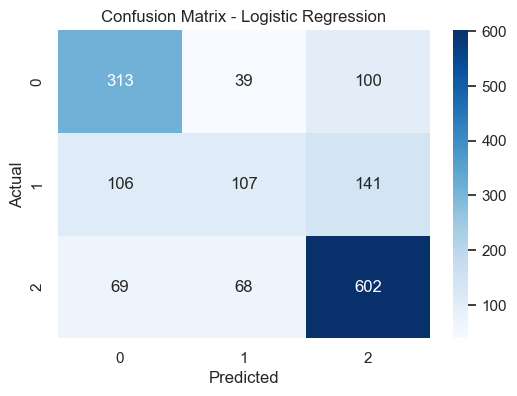

              precision    recall  f1-score   support

           0       0.64      0.69      0.67       452
           1       0.50      0.30      0.38       354
           2       0.71      0.81      0.76       739

    accuracy                           0.66      1545
   macro avg       0.62      0.60      0.60      1545
weighted avg       0.64      0.66      0.65      1545



In [99]:
#--------------------------------------------------#
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

log_model = LogisticRegression(max_iter=1000)
log_model.fit(X_train, y_train)

# Step 3: Test Accuracy
y_pred = log_model.predict(X_test)
log_test_acc = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {log_test_acc:.4f}")

# Step 4: Cross Validation Accuracy on training set
log_cv_scores = cross_val_score(log_model, X_train, y_train, cv=10, scoring='accuracy')
print(f"Cross Validation Accuracy: {log_cv_scores.mean():.4f}")

# Step 5: Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Visualization
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d')
plt.title('Confusion Matrix - Logistic Regression')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()
with open('logistic.pkl', 'wb') as file:
    pickle.dump(log_model, file)
# Optional: Classification report
print(classification_report(y_test, y_pred))

Varying C (regularization strength)...
Testing C=0.1
  Accuracy: 0.6621, Train time: 0.1082s, Test time: 0.0010s
Testing C=1.0
  Accuracy: 0.6615, Train time: 0.0349s, Test time: 0.0020s
Testing C=10.0
  Accuracy: 0.6615, Train time: 0.0732s, Test time: 0.0010s

Varying solver...
Testing solver=lbfgs
  Accuracy: 0.6615, Train time: 0.0470s, Test time: 0.0020s
Testing solver=liblinear
  Accuracy: 0.6647, Train time: 0.0967s, Test time: 0.0020s
Testing solver=saga
  Accuracy: 0.6615, Train time: 0.1182s, Test time: 0.0020s


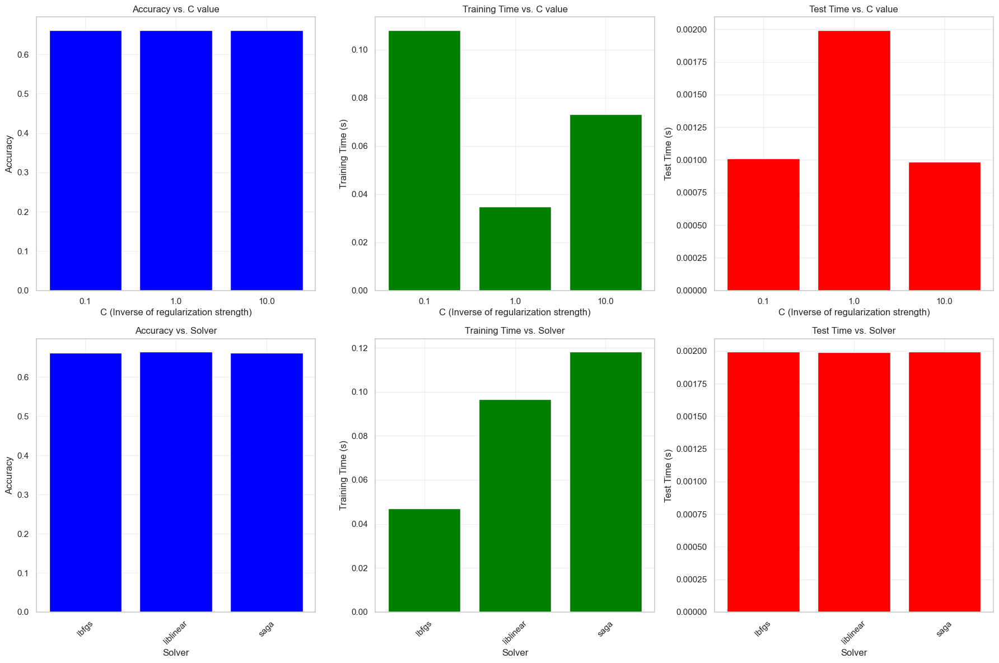


Best C value: 0.1 with accuracy 0.6621
Best solver: liblinear with accuracy 0.6647

Testing the best combination...
Best combination accuracy: 0.6634


In [100]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_iris
from sklearn.metrics import accuracy_score
import numpy as np
import matplotlib.pyplot as plt
import time

# Fixed hyperparameters
max_iter = 1000
random_state = 42

# Values to test for each hyperparameter
C_values = [0.1, 1.0, 10.0]
solver_values = ['lbfgs', 'liblinear', 'saga']

# Results storage
results = {
    'C': {
        'values': C_values,
        'accuracy': [],
        'train_time': [],
        'test_time': []
    },
    'solver': {
        'values': solver_values,
        'accuracy': [],
        'train_time': [],
        'test_time': []
    },
    'fixed': {'max_iter': 1000, 'random_state': 0}
}

# Study C values (keeping solver fixed as 'lbfgs')
print("Varying C (regularization strength)...")
for C in C_values:
    print(f"Testing C={C}")
    model = LogisticRegression(C=C, solver='lbfgs', max_iter=max_iter, random_state=random_state)
    
    # Training time
    start_time = time.time()
    model.fit(X_train, y_train)
    train_time = time.time() - start_time
    
    # Testing time
    start_time = time.time()
    y_pred = model.predict(X_test)
    test_time = time.time() - start_time
    
    # Accuracy
    accuracy = accuracy_score(y_test, y_pred)
    
    # Store results
    results['C']['accuracy'].append(accuracy)
    results['C']['train_time'].append(train_time)
    results['C']['test_time'].append(test_time)
    
    print(f"  Accuracy: {accuracy:.4f}, Train time: {train_time:.4f}s, Test time: {test_time:.4f}s")

# Study solver values (keeping C fixed as 1.0)
print("\nVarying solver...")
for solver in solver_values:
    print(f"Testing solver={solver}")
    model = LogisticRegression(C=1.0, solver=solver, max_iter=max_iter, random_state=random_state)
    
    # Training time
    start_time = time.time()
    model.fit(X_train, y_train)
    train_time = time.time() - start_time
    
    # Testing time
    start_time = time.time()
    y_pred = model.predict(X_test)
    test_time = time.time() - start_time
    
    # Accuracy
    accuracy = accuracy_score(y_test, y_pred)
    
    # Store results
    results['solver']['accuracy'].append(accuracy)
    results['solver']['train_time'].append(train_time)
    results['solver']['test_time'].append(test_time)
    
    print(f"  Accuracy: {accuracy:.4f}, Train time: {train_time:.4f}s, Test time: {test_time:.4f}s")

# Create bar graphs to visualize results
plt.figure(figsize=(18, 12))

# Plot for C values
# Accuracy
plt.subplot(2, 3, 1)
plt.bar([str(c) for c in C_values], results['C']['accuracy'], color='blue')
plt.title('Accuracy vs. C value')
plt.xlabel('C (Inverse of regularization strength)')
plt.ylabel('Accuracy')
plt.grid(True, alpha=0.3)

# Training time
plt.subplot(2, 3, 2)
plt.bar([str(c) for c in C_values], results['C']['train_time'], color='green')
plt.title('Training Time vs. C value')
plt.xlabel('C (Inverse of regularization strength)')
plt.ylabel('Training Time (s)')
plt.grid(True, alpha=0.3)

# Test time
plt.subplot(2, 3, 3)
plt.bar([str(c) for c in C_values], results['C']['test_time'], color='red')
plt.title('Test Time vs. C value')
plt.xlabel('C (Inverse of regularization strength)')
plt.ylabel('Test Time (s)')
plt.grid(True, alpha=0.3)

# Plot for solver values
# Accuracy
plt.subplot(2, 3, 4)
plt.bar(solver_values, results['solver']['accuracy'], color='blue')
plt.title('Accuracy vs. Solver')
plt.xlabel('Solver')
plt.ylabel('Accuracy')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)

# Training time
plt.subplot(2, 3, 5)
plt.bar(solver_values, results['solver']['train_time'], color='green')
plt.title('Training Time vs. Solver')
plt.xlabel('Solver')
plt.ylabel('Training Time (s)')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)

# Test time
plt.subplot(2, 3, 6)
plt.bar(solver_values, results['solver']['test_time'], color='red')
plt.title('Test Time vs. Solver')
plt.xlabel('Solver')
plt.ylabel('Test Time (s)')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print best parameters
best_c_accuracy_idx = np.argmax(results['C']['accuracy'])
best_c = C_values[best_c_accuracy_idx]
best_c_accuracy = results['C']['accuracy'][best_c_accuracy_idx]

best_solver_accuracy_idx = np.argmax(results['solver']['accuracy'])
best_solver = solver_values[best_solver_accuracy_idx]
best_solver_accuracy = results['solver']['accuracy'][best_solver_accuracy_idx]

print(f"\nBest C value: {best_c} with accuracy {best_c_accuracy:.4f}")
print(f"Best solver: {best_solver} with accuracy {best_solver_accuracy:.4f}")

# Optional: Test the best combination
print("\nTesting the best combination...")
best_model = LogisticRegression(C=best_c, solver=best_solver, max_iter=max_iter, random_state=random_state)
best_model.fit(X_train, y_train)
best_pred = best_model.predict(X_test)
best_accuracy = accuracy_score(y_test, best_pred)
print(f"Best combination accuracy: {best_accuracy:.4f}")

## Many Models

### KNN Model with best K

k=24, mean accuracy=0.6354
k=26, mean accuracy=0.6361
k=28, mean accuracy=0.6354
k=30, mean accuracy=0.6359
k=32, mean accuracy=0.6383
k=34, mean accuracy=0.6393
k=36, mean accuracy=0.6370
k=38, mean accuracy=0.6376
k=40, mean accuracy=0.6380
k=42, mean accuracy=0.6375
k=44, mean accuracy=0.6350
k=46, mean accuracy=0.6352
k=48, mean accuracy=0.6358
k=50, mean accuracy=0.6357
k=52, mean accuracy=0.6363
k=54, mean accuracy=0.6357
k=56, mean accuracy=0.6389
k=58, mean accuracy=0.6387


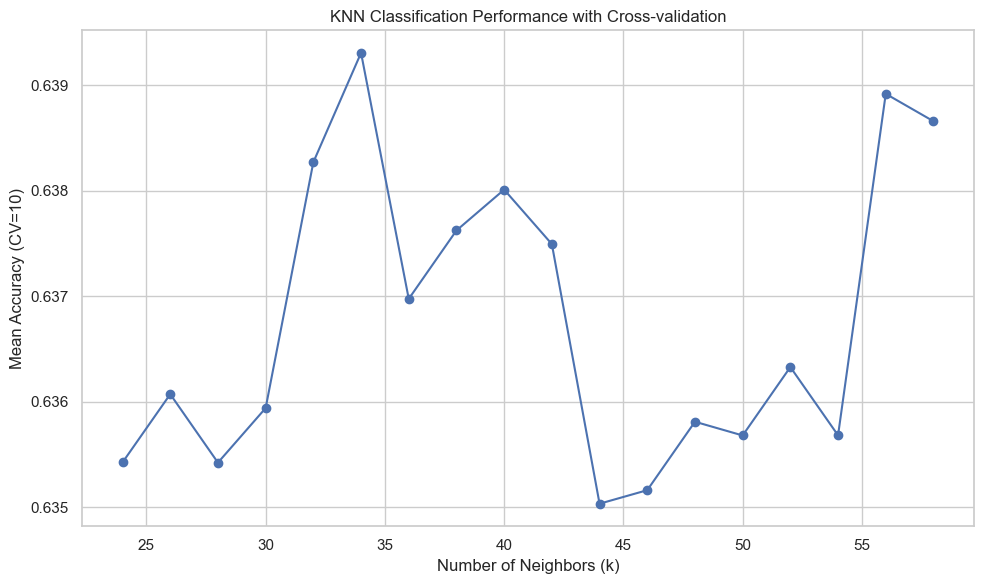


Best number of neighbors (k): 34 with Accuracy = 0.6393


In [101]:
#--------------------------------------------------#


from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import numpy as np
import matplotlib.pyplot as plt

# بيانات التدريب
wss = []

# تعيين نطاق قيم k
k_values = range(24, 60, 2)
mean_accuracy_scores = []

# استخدم KNeighborsClassifier بدلاً من KNeighborsRegressor
for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k, weights='distance')
    
    # تقييم الأداء باستخدام cross-validation
    scores = cross_val_score(knn, X_scaled_df, y, cv=10, scoring='accuracy')
    mean_accuracy = scores.mean()
    mean_accuracy_scores.append(mean_accuracy)
    
    print(f"k={k}, mean accuracy={mean_accuracy:.4f}")
# لو حابب ترسم الأداء حسب k
plt.figure(figsize=(10, 6))
plt.plot(k_values, mean_accuracy_scores, marker='o', linestyle='-')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Mean Accuracy (CV=10)')
plt.title('KNN Classification Performance with Cross-validation')
plt.grid(True)
plt.tight_layout()
plt.show()

# Find best k
best_k_index = np.argmax(mean_accuracy_scores)
best_k = k_values[best_k_index]
best_accuracy = mean_accuracy_scores[best_k_index]

print(f"\nBest number of neighbors (k): {best_k} with Accuracy = {best_accuracy:.4f}")
with open('knn.pkl', 'wb') as file:
    pickle.dump(knn, file)

# # بناء النموذج النهائي باستخدام أفضل k
# knn_best = KNeighborsClassifier(n_neighbors=best_k, weights='distance')
# knn_best.fit(X_scaled_df, y)

# y_pred_train = knn_best.predict(X_train)

# # التنبؤات على مجموعة البيانات الاختبارية
# y_pred_test = knn_best.predict(X_test)
# train_accuracy = accuracy_score(y_train, y_pred_train)
# print('Train Accuracy: {:.4f}'.format(train_accuracy))

# # حساب دقة النموذج على البيانات الاختبارية
# test_accuracy = accuracy_score(y_test, y_pred_test)

# # عرض مصفوفة الارتباك و تقرير التصنيف
# conf_matrix = confusion_matrix(y_test, y_pred_test)
# class_report = classification_report(y_test, y_pred_test)

# print(f"Test Accuracy: {test_accuracy:.4f}")
# print("Confusion Matrix:")
# print(conf_matrix)
# print("\nClassification Report:")
# print(class_report)


Evaluating KNN with different values of k...

Testing k=24
  Accuracy: 0.6278, CV Accuracy: 0.6310, Train Time: 0.0050s, Test Time: 0.1066s
Testing k=26
  Accuracy: 0.6252, CV Accuracy: 0.6283, Train Time: 0.0050s, Test Time: 0.0535s
Testing k=28
  Accuracy: 0.6246, CV Accuracy: 0.6321, Train Time: 0.0030s, Test Time: 0.0660s
Testing k=30
  Accuracy: 0.6227, CV Accuracy: 0.6326, Train Time: 0.0030s, Test Time: 0.0309s
Testing k=32
  Accuracy: 0.6233, CV Accuracy: 0.6328, Train Time: 0.0030s, Test Time: 0.0369s
Testing k=34
  Accuracy: 0.6214, CV Accuracy: 0.6367, Train Time: 0.0030s, Test Time: 0.0339s
Testing k=36
  Accuracy: 0.6285, CV Accuracy: 0.6354, Train Time: 0.0020s, Test Time: 0.0379s
Testing k=38
  Accuracy: 0.6278, CV Accuracy: 0.6339, Train Time: 0.0020s, Test Time: 0.0359s
Testing k=40
  Accuracy: 0.6278, CV Accuracy: 0.6352, Train Time: 0.0020s, Test Time: 0.0408s
Testing k=42
  Accuracy: 0.6285, CV Accuracy: 0.6352, Train Time: 0.0050s, Test Time: 0.0359s
Testing k=44
 

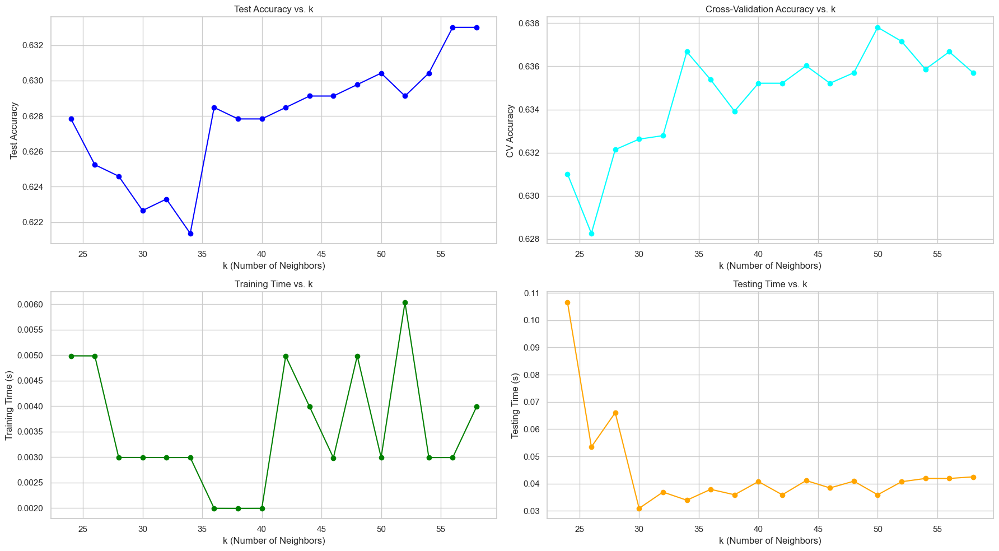


✅ Best k: 56 with Test Accuracy = 0.6330

Testing the best k on the data...
Test Accuracy with best k = 0.6330
Confusion Matrix:
[[266  31 155]
 [ 85  50 219]
 [ 51  26 662]]

Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.59      0.62       452
           1       0.47      0.14      0.22       354
           2       0.64      0.90      0.75       739

    accuracy                           0.63      1545
   macro avg       0.59      0.54      0.53      1545
weighted avg       0.61      0.63      0.59      1545



In [102]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import numpy as np
import matplotlib.pyplot as plt
import time

# Define range of k values
k_values = list(range(24, 60, 2))

# Results storage
results = {
    'k': {
        'values': k_values,
        'accuracy': [],
        'cv_accuracy': [],
        'train_time': [],
        'test_time': []
    }
}

print("Evaluating KNN with different values of k...\n")

for k in k_values:
    print(f"Testing k={k}")
    knn = KNeighborsClassifier(n_neighbors=k, weights='distance')
    
    # Training time
    start_time = time.time()
    knn.fit(X_train, y_train)
    train_time = time.time() - start_time

    # Test time
    start_time = time.time()
    y_pred = knn.predict(X_test)
    test_time = time.time() - start_time

    # Accuracy
    accuracy = accuracy_score(y_test, y_pred)

    # Cross-validation accuracy
    cv_scores = cross_val_score(knn, X_train, y_train, cv=5)
    mean_cv_accuracy = cv_scores.mean()

    # Save results
    results['k']['accuracy'].append(accuracy)
    results['k']['cv_accuracy'].append(mean_cv_accuracy)
    results['k']['train_time'].append(train_time)
    results['k']['test_time'].append(test_time)

    print(f"  Accuracy: {accuracy:.4f}, CV Accuracy: {mean_cv_accuracy:.4f}, Train Time: {train_time:.4f}s, Test Time: {test_time:.4f}s")

# Visualization
plt.figure(figsize=(18, 10))

# Test Accuracy vs k
plt.subplot(2, 2, 1)
plt.plot(k_values, results['k']['accuracy'], marker='o', color='blue')
plt.title('Test Accuracy vs. k')
plt.xlabel('k (Number of Neighbors)')
plt.ylabel('Test Accuracy')
plt.grid(True)

# CV Accuracy vs k
plt.subplot(2, 2, 2)
plt.plot(k_values, results['k']['cv_accuracy'], marker='o', color='cyan')
plt.title('Cross-Validation Accuracy vs. k')
plt.xlabel('k (Number of Neighbors)')
plt.ylabel('CV Accuracy')
plt.grid(True)

# Train Time vs k
plt.subplot(2, 2, 3)
plt.plot(k_values, results['k']['train_time'], marker='o', color='green')
plt.title('Training Time vs. k')
plt.xlabel('k (Number of Neighbors)')
plt.ylabel('Training Time (s)')
plt.grid(True)

# Test Time vs k
plt.subplot(2, 2, 4)
plt.plot(k_values, results['k']['test_time'], marker='o', color='orange')
plt.title('Testing Time vs. k')
plt.xlabel('k (Number of Neighbors)')
plt.ylabel('Testing Time (s)')
plt.grid(True)

plt.tight_layout()
plt.show()

# Best k based on test accuracy
best_k_idx = np.argmax(results['k']['accuracy'])
best_k = k_values[best_k_idx]
best_acc = results['k']['accuracy'][best_k_idx]

print(f"\n✅ Best k: {best_k} with Test Accuracy = {best_acc:.4f}")

# Final model with best k
print("\nTesting the best k on the data...")
knn_best = KNeighborsClassifier(n_neighbors=best_k, weights='distance')
knn_best.fit(X_train, y_train)

y_pred_best = knn_best.predict(X_test)
final_acc = accuracy_score(y_test, y_pred_best)
conf_matrix = confusion_matrix(y_test, y_pred_best)
class_report = classification_report(y_test, y_pred_best)

print(f"Test Accuracy with best k = {final_acc:.4f}")
with open('knn1.pkl', 'wb') as file:
    pickle.dump(knn, file)
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)


## Decision Tree Model

In [103]:
#----------------------#

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# تعريف شبكة المعاملات (hyperparameters) لشجرة القرار
param_grid = {
    'max_depth': [2, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

DT_model = DecisionTreeClassifier(random_state=0)

grid_search = GridSearchCV(estimator=DT_model, param_grid=param_grid, cv=5, scoring='accuracy')

grid_search.fit(X_train, y_train)

# الحصول على أفضل المعاملات
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

best_DT_model = grid_search.best_estimator_

y_pred = best_DT_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)
with open('decision.pkl', 'wb') as file:
    pickle.dump(grid_search, file)


Best Hyperparameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}
Accuracy: 0.6615
Confusion Matrix:
[[261  98  93]
 [ 53 161 140]
 [ 39 100 600]]

Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.58      0.65       452
           1       0.45      0.45      0.45       354
           2       0.72      0.81      0.76       739

    accuracy                           0.66      1545
   macro avg       0.64      0.61      0.62      1545
weighted avg       0.66      0.66      0.66      1545



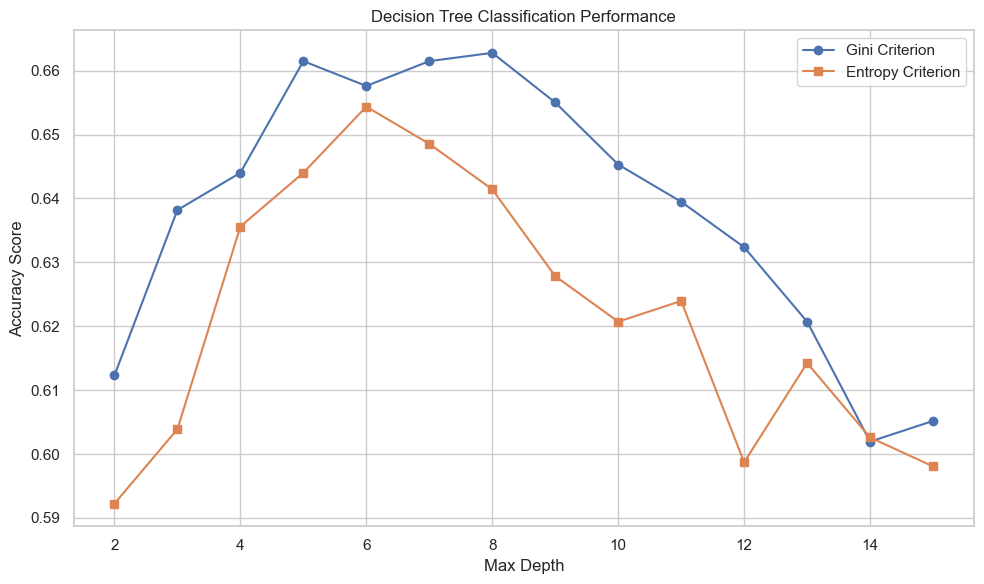

In [104]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

accuracy_scores_se = []
accuracy_scores_fmse = []

for i in range(2, 16):
    # استخدام معيار 'gini' لشجرة القرار
    clf1 = DecisionTreeClassifier(max_depth=i, criterion="gini", random_state=0)
    clf1.fit(X_train, y_train)
    y_pred1 = clf1.predict(X_test)
    accuracy_scores_se.append(accuracy_score(y_test, y_pred1))
    
    # استخدام معيار 'entropy' لشجرة القرار
    clf2 = DecisionTreeClassifier(max_depth=i, criterion="entropy", random_state=0)
    clf2.fit(X_train, y_train)
    y_pred2 = clf2.predict(X_test)
    accuracy_scores_fmse.append(accuracy_score(y_test, y_pred2))

# رسم النتائج
plt.figure(figsize=(10, 6))
plt.plot(range(2, 16), accuracy_scores_se, label="Gini Criterion", marker='o')
plt.plot(range(2, 16), accuracy_scores_fmse, label="Entropy Criterion", marker='s')
plt.xlabel("Max Depth")
plt.ylabel("Accuracy Score")
plt.title("Decision Tree Classification Performance")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Decision Tree Classifier Accuracy (Train): 0.7101
Decision Tree Classifier Accuracy (Test): 0.6576


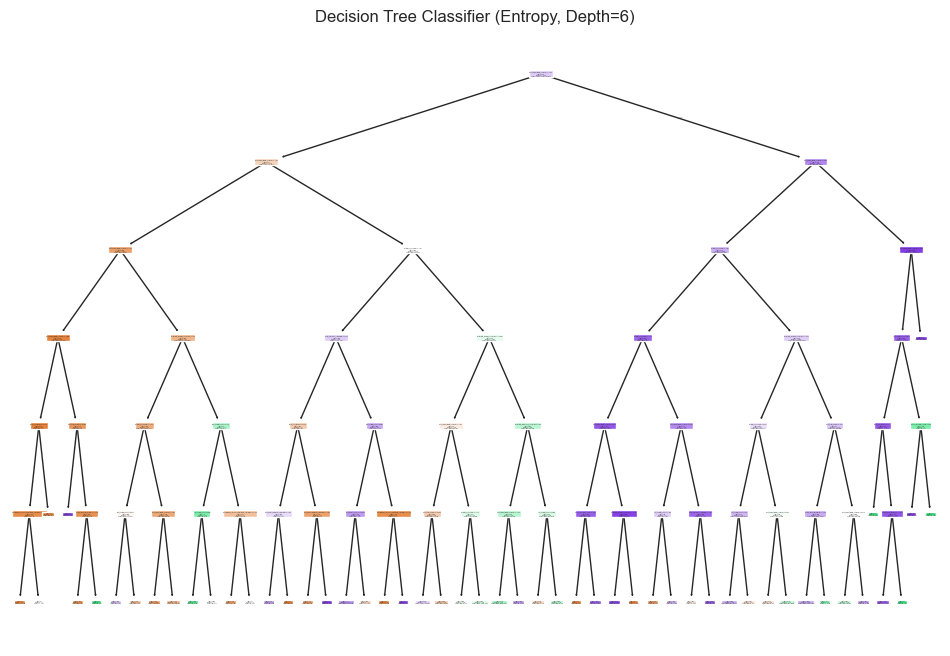

In [105]:

from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt
from sklearn import tree

# Initialize the model using entropy and depth=6
clf = DecisionTreeClassifier(criterion='gini', max_depth=6, random_state=0)

# Fit the model
clf.fit(X_train, y_train)

# Predictions
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)
train_accuracy_DT = accuracy_score(y_train, y_pred_train)
accuracy_DT = accuracy_score(y_test, y_pred_test)
# Accuracy Scores
print('Decision Tree Classifier Accuracy (Train): {0:0.4f}'.format(train_accuracy_DT))
print('Decision Tree Classifier Accuracy (Test): {0:0.4f}'.format(accuracy_DT))


# Cross-validation accuracy
cv_accuracy_DT = cross_val_score(clf, X_train, y_train, cv=10, scoring='accuracy')
#print('cv Accuracy Score: {:.4f}'.format(cv_accuracy_DT.mean()))

# Plotting the Decision Tree
plt.figure(figsize=(12, 8))
tree.plot_tree(clf, filled=True, feature_names=list(X_train.columns))
plt.title("Decision Tree Classifier (Entropy, Depth=6)")
plt.show()


Hyperparameters: criterion=gini, max_depth=4, min_samples_split=2, min_samples_leaf=1
Train Accuracy: 0.6346, Test Accuracy: 0.6065
Train Time: 0.1085s, Test Time: 0.0020s

Hyperparameters: criterion=gini, max_depth=4, min_samples_split=2, min_samples_leaf=2
Train Accuracy: 0.6346, Test Accuracy: 0.6065
Train Time: 0.0581s, Test Time: 0.0019s

Hyperparameters: criterion=gini, max_depth=4, min_samples_split=2, min_samples_leaf=4
Train Accuracy: 0.6346, Test Accuracy: 0.6065
Train Time: 0.0608s, Test Time: 0.0010s

Hyperparameters: criterion=gini, max_depth=4, min_samples_split=5, min_samples_leaf=1
Train Accuracy: 0.6346, Test Accuracy: 0.6065
Train Time: 0.0595s, Test Time: 0.0010s

Hyperparameters: criterion=gini, max_depth=4, min_samples_split=5, min_samples_leaf=2
Train Accuracy: 0.6346, Test Accuracy: 0.6065
Train Time: 0.0619s, Test Time: 0.0010s

Hyperparameters: criterion=gini, max_depth=4, min_samples_split=5, min_samples_leaf=4
Train Accuracy: 0.6346, Test Accuracy: 0.6065
Tra

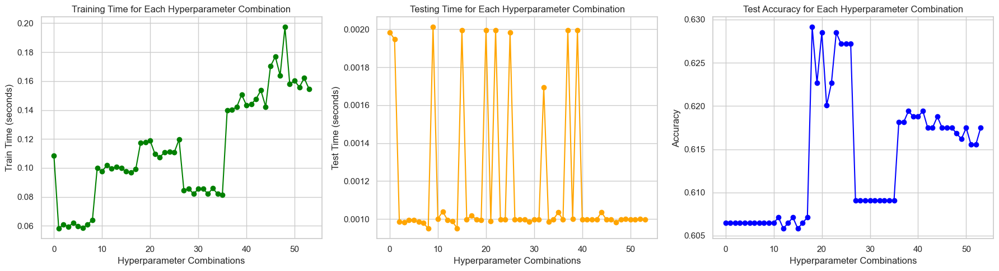

In [106]:
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn import tree
from imblearn.over_sampling import SMOTE
import numpy as np
import seaborn as sns
import time

# Step 1: Feature selection using Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=0)
rf.fit(X_train, y_train)

# Get top 30 features
importances = rf.feature_importances_
indices = np.argsort(importances)[-30:]  # Top 30
top_features = X_train.columns[indices]

# Filter train/test data with top features
X_train_top = X_train[top_features]
X_test_top = X_test[top_features]

# Step 2: Apply SMOTE
smote = SMOTE(random_state=0)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_top, y_train)

# Step 3: Hyperparameter tuning
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [4, 7, 8],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Prepare lists to store results
train_times = []
test_times = []
train_accuracies = []
test_accuracies = []

# Loop over combinations of hyperparameters
for criterion in param_grid['criterion']:
    for max_depth in param_grid['max_depth']:
        for min_samples_split in param_grid['min_samples_split']:
            for min_samples_leaf in param_grid['min_samples_leaf']:

                # Initialize DecisionTreeClassifier with current parameters
                clf = DecisionTreeClassifier(
                    criterion=criterion,
                    max_depth=max_depth,
                    min_samples_split=min_samples_split,
                    min_samples_leaf=min_samples_leaf,
                    random_state=0
                )

                # Train Time
                start_train = time.time()
                clf.fit(X_train_resampled, y_train_resampled)
                train_time = time.time() - start_train

                # Test Time
                start_test = time.time()
                y_pred_test = clf.predict(X_test_top)
                test_time = time.time() - start_test

                # Accuracy
                y_pred_train = clf.predict(X_train_top)
                train_acc = accuracy_score(y_train, y_pred_train)
                test_acc = accuracy_score(y_test, y_pred_test)

                # Store results
                train_times.append(train_time)
                test_times.append(test_time)
                train_accuracies.append(train_acc)
                test_accuracies.append(test_acc)

                # Print results for current combination
                print(f"Hyperparameters: criterion={criterion}, max_depth={max_depth}, "
                      f"min_samples_split={min_samples_split}, min_samples_leaf={min_samples_leaf}")
                print(f"Train Accuracy: {train_acc:.4f}, Test Accuracy: {test_acc:.4f}")
                print(f"Train Time: {train_time:.4f}s, Test Time: {test_time:.4f}s\n")

# Step 4: Plot results
plt.figure(figsize=(18, 5))

# Train time plot
plt.subplot(1, 3, 1)
plt.plot(range(len(train_times)), train_times, marker='o', linestyle='-', color='green')
plt.xlabel('Hyperparameter Combinations')
plt.ylabel('Train Time (seconds)')
plt.title('Training Time for Each Hyperparameter Combination')

# Test time plot
plt.subplot(1, 3, 2)
plt.plot(range(len(test_times)), test_times, marker='o', linestyle='-', color='orange')
plt.xlabel('Hyperparameter Combinations')
plt.ylabel('Test Time (seconds)')
plt.title('Testing Time for Each Hyperparameter Combination')

# Accuracy plot (Test Accuracy)
plt.subplot(1, 3, 3)
plt.plot(range(len(test_accuracies)), test_accuracies, marker='o', linestyle='-', color='blue')
plt.xlabel('Hyperparameter Combinations')
plt.ylabel('Accuracy')
plt.title('Test Accuracy for Each Hyperparameter Combination')

plt.tight_layout()
plt.show()


## Random Forest with Feature Selection

Hyperparameters: n_estimators=100, max_depth=None
Test Accuracy: 0.6725
Train Time: 1.4577s, Test Time: 0.0259s

Hyperparameters: n_estimators=100, max_depth=10
Test Accuracy: 0.6738
Train Time: 1.1047s, Test Time: 0.0210s

Hyperparameters: n_estimators=100, max_depth=20
Test Accuracy: 0.6680
Train Time: 1.6542s, Test Time: 0.0309s

Hyperparameters: n_estimators=150, max_depth=None
Test Accuracy: 0.6744
Train Time: 2.3473s, Test Time: 0.0399s

Hyperparameters: n_estimators=150, max_depth=10
Test Accuracy: 0.6751
Train Time: 1.6804s, Test Time: 0.0328s

Hyperparameters: n_estimators=150, max_depth=20
Test Accuracy: 0.6699
Train Time: 2.3452s, Test Time: 0.0391s

Hyperparameters: n_estimators=200, max_depth=None
Test Accuracy: 0.6738
Train Time: 3.1838s, Test Time: 0.0539s

Hyperparameters: n_estimators=200, max_depth=10
Test Accuracy: 0.6796
Train Time: 2.2675s, Test Time: 0.0421s

Hyperparameters: n_estimators=200, max_depth=20
Test Accuracy: 0.6757
Train Time: 3.1215s, Test Time: 0.05

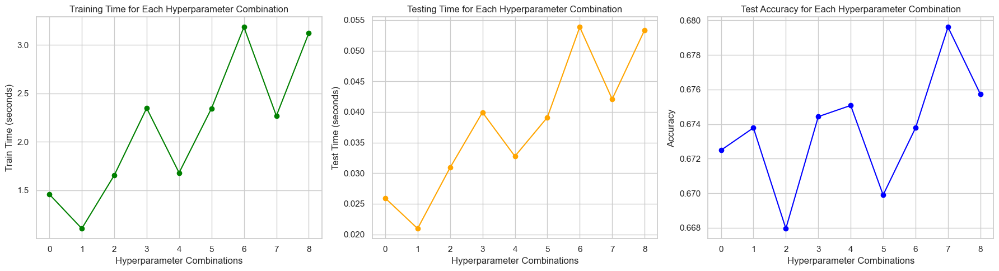

Cross-validation Accuracy Scores: [0.70711974 0.6618123  0.67961165 0.67475728 0.64563107 0.6407767
 0.6828479  0.69902913 0.70711974 0.64829822]
Mean CV Accuracy: 0.6747


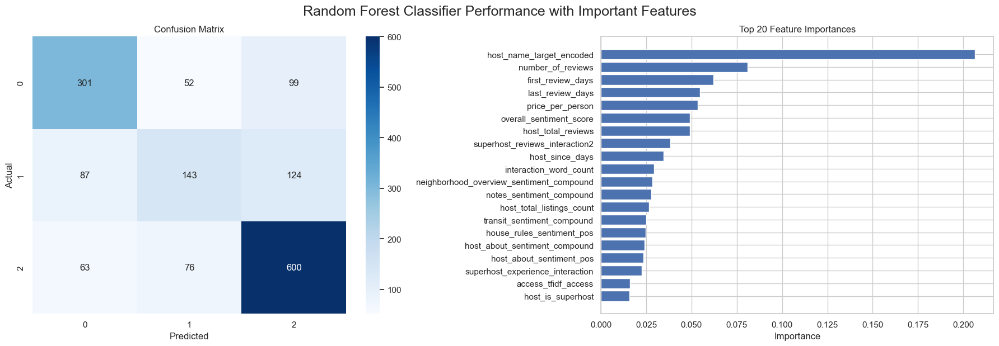

In [107]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score
import time
import numpy as np

# Initialize the Random Forest Classifier
RF = RandomForestClassifier(n_estimators=100, random_state=0)

# Fit the model
RF.fit(X_train, y_train)

# Get feature importance
feature_importance = RF.feature_importances_

# Select top 20 important features
important_features = X_train.columns[feature_importance.argsort()][-20:]

# New data with important features only
X_train_important = X_train[important_features]
X_test_important = X_test[important_features]

# Prepare lists to store results
train_times = []
test_times = []
train_accuracies = []
test_accuracies = []

# Loop over different hyperparameters for Random Forest (e.g., n_estimators, max_depth)
n_estimators_values = [100, 150, 200]
max_depth_values = [None, 10, 20]

# Loop over combinations of hyperparameters
for n_estimators in n_estimators_values:
    for max_depth in max_depth_values:
        # Initialize RandomForestClassifier with current parameters
        rf = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth, random_state=0)

        # Train Time
        start_train = time.time()
        rf.fit(X_train_important, y_train)
        train_time = time.time() - start_train

        # Test Time
        start_test = time.time()
        predict_RF_important = rf.predict(X_test_important)
        test_time = time.time() - start_test

        # Accuracy
        test_acc = accuracy_score(y_test, predict_RF_important)

        # Store results
        train_times.append(train_time)
        test_times.append(test_time)
       
        test_accuracies.append(test_acc)

        # Print results for current combination
        print(f"Hyperparameters: n_estimators={n_estimators}, max_depth={max_depth}")
        print(f"Test Accuracy: {test_acc:.4f}")
        print(f"Train Time: {train_time:.4f}s, Test Time: {test_time:.4f}s\n")

# Step 4: Plot results
plt.figure(figsize=(18, 5))

# Train time plot
plt.subplot(1, 3, 1)
plt.plot(range(len(train_times)), train_times, marker='o', linestyle='-', color='green')
plt.xlabel('Hyperparameter Combinations')
plt.ylabel('Train Time (seconds)')
plt.title('Training Time for Each Hyperparameter Combination')

# Test time plot
plt.subplot(1, 3, 2)
plt.plot(range(len(test_times)), test_times, marker='o', linestyle='-', color='orange')
plt.xlabel('Hyperparameter Combinations')
plt.ylabel('Test Time (seconds)')
plt.title('Testing Time for Each Hyperparameter Combination')

# Accuracy plot (Test Accuracy)
plt.subplot(1, 3, 3)
plt.plot(range(len(test_accuracies)), test_accuracies, marker='o', linestyle='-', color='blue')
plt.xlabel('Hyperparameter Combinations')
plt.ylabel('Accuracy')
plt.title('Test Accuracy for Each Hyperparameter Combination')

plt.tight_layout()
plt.show()

# Cross-validation
cv_accuracy = cross_val_score(RF, X_train_important, y_train, cv=10, scoring='accuracy')
print(f"Cross-validation Accuracy Scores: {cv_accuracy}")
print(f"Mean CV Accuracy: {cv_accuracy.mean():.4f}")

# Confusion Matrix Plot
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix(y_test, predict_RF_important), annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")

# Feature Importance Plot
plt.subplot(1, 2, 2)
sorted_idx = feature_importance.argsort()[-20:]
plt.barh(X_train.columns[sorted_idx], feature_importance[sorted_idx])
plt.title("Top 20 Feature Importances")
plt.xlabel("Importance")

plt.tight_layout()
plt.suptitle('Random Forest Classifier Performance with Important Features', fontsize=18, y=1.03)
plt.show()


Random Forest Classifier Accuracy: 0.6466

Classification Report:
               precision    recall  f1-score   support

           0       0.65      0.66      0.65       452
           1       0.45      0.51      0.48       354
           2       0.76      0.71      0.73       739

    accuracy                           0.65      1545
   macro avg       0.62      0.62      0.62      1545
weighted avg       0.66      0.65      0.65      1545

Cross-validation Accuracy Scores: [0.71106095 0.68848758 0.72009029 0.69638826 0.71444695 0.77088036
 0.85440181 0.86230248 0.85665914 0.85988701]
Mean CV Accuracy: 0.7735


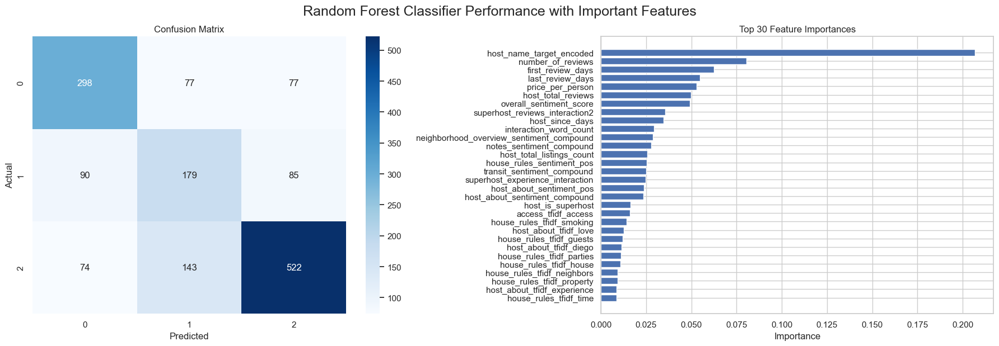

In [108]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score
from imblearn.over_sampling import SMOTE
import numpy as np

RF = RandomForestClassifier(n_estimators=200, max_depth=None, random_state=0)

RF.fit(X_train, y_train)

feature_importance = RF.feature_importances_

important_features = X_train.columns[feature_importance.argsort()][-30:]

X_train_important = X_train[important_features]
X_test_important = X_test[important_features]

smote = SMOTE(random_state=0)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_important, y_train)

RF.fit(X_train_resampled, y_train_resampled)

predict_RF_important = RF.predict(X_test_important)

accuracy = accuracy_score(y_test, predict_RF_important)
print(f"Random Forest Classifier Accuracy: {accuracy:.4f}")
print("\nClassification Report:\n", classification_report(y_test, predict_RF_important))

cv_accuracy = cross_val_score(RF, X_train_resampled, y_train_resampled, cv=10, scoring='accuracy')
print(f"Cross-validation Accuracy Scores: {cv_accuracy}")
print(f"Mean CV Accuracy: {cv_accuracy.mean():.4f}")

plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix(y_test, predict_RF_important), annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.subplot(1, 2, 2)
sorted_idx = feature_importance.argsort()[-30:]
plt.barh(X_train.columns[sorted_idx], feature_importance[sorted_idx])
plt.title("Top 30 Feature Importances")
plt.xlabel("Importance")

plt.tight_layout()
plt.suptitle('Random Forest Classifier Performance with Important Features', fontsize=18, y=1.03)
plt.show()
with open('randomForest.pkl', 'wb') as file:
    pickle.dump(RF, file)

## GradientBoostingRegressor , RandomForestRegressor , XGBRegressor Models

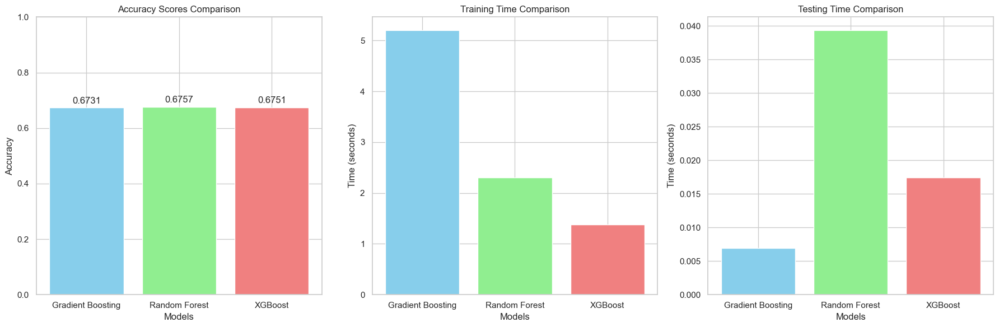

Gradient Boosting Accuracy: 0.6731
Random Forest Accuracy: 0.6757
XGBoost Accuracy: 0.6751


In [109]:
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
import time

# Initialize models
gb_model = GradientBoostingClassifier(n_estimators=100, max_depth=2, random_state=0)
rf_model = RandomForestClassifier(n_estimators=200, max_depth=10, random_state=0)
xgb_model = XGBClassifier(n_estimators=100, max_depth=2, learning_rate=0.1, random_state=0)

# Store times and accuracies
train_times = []
test_times = []
accuracy_scores = []
models = ['Gradient Boosting', 'Random Forest', 'XGBoost']  # Define models list

# Train and evaluate Gradient Boosting
start_train = time.time()
gb_model.fit(X_train, y_train)
train_time_gb = time.time() - start_train
start_test = time.time()
y_pred_gb = gb_model.predict(X_test)
test_time_gb = time.time() - start_test
accuracy_gb = accuracy_score(y_test, y_pred_gb)

# Store Gradient Boosting results
train_times.append(train_time_gb)
test_times.append(test_time_gb)
accuracy_scores.append(accuracy_gb)

# Train and evaluate Random Forest
start_train = time.time()
rf_model.fit(X_train, y_train)
train_time_rf = time.time() - start_train
start_test = time.time()
y_pred_rf = rf_model.predict(X_test)
test_time_rf = time.time() - start_test
accuracy_rf = accuracy_score(y_test, y_pred_rf)

# Store Random Forest results
train_times.append(train_time_rf)
test_times.append(test_time_rf)
accuracy_scores.append(accuracy_rf)

# Train and evaluate XGBoost
start_train = time.time()
xgb_model.fit(X_train, y_train)
train_time_xgb = time.time() - start_train
start_test = time.time()
y_pred_xgb = xgb_model.predict(X_test)
test_time_xgb = time.time() - start_test
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)

# Store XGBoost results
train_times.append(train_time_xgb)
test_times.append(test_time_xgb)
accuracy_scores.append(accuracy_xgb)

# Create a bar plot for accuracy scores
plt.figure(figsize=(18, 6))

# Accuracy Plot
plt.subplot(1, 3, 1)
plt.bar(models, accuracy_scores, color=['skyblue', 'lightgreen', 'lightcoral'])
plt.title('Accuracy Scores Comparison')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.ylim([0, 1])  # Ensures that the y-axis ranges from 0 to 1
# Add accuracy text labels above bars
for i, v in enumerate(accuracy_scores):
    plt.text(i, v + 0.01, f'{v:.4f}', ha='center', va='bottom')

# Training Time Plot
plt.subplot(1, 3, 2)
plt.bar(models, train_times, color=['skyblue', 'lightgreen', 'lightcoral'])
plt.title('Training Time Comparison')
plt.xlabel('Models')
plt.ylabel('Time (seconds)')

# Testing Time Plot
plt.subplot(1, 3, 3)
plt.bar(models, test_times, color=['skyblue', 'lightgreen', 'lightcoral'])
plt.title('Testing Time Comparison')
plt.xlabel('Models')
plt.ylabel('Time (seconds)')


# Adjust layout for a better view
plt.tight_layout()
plt.show()

# Print accuracy scores
print(f"Gradient Boosting Accuracy: {accuracy_gb:.4f}")
print(f"Random Forest Accuracy: {accuracy_rf:.4f}")
print(f"XGBoost Accuracy: {accuracy_xgb:.4f}")


In [110]:
# import matplotlib.pyplot as plt
# from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
# from xgboost import XGBClassifier
# from sklearn.metrics import accuracy_score
# import time
# from imblearn.over_sampling import SMOTE
# from sklearn.model_selection import cross_val_score

# # Initialize models
# gb_model = GradientBoostingClassifier(n_estimators=100, random_state=0)
# rf_model = RandomForestClassifier(n_estimators=100, max_depth=None, random_state=0)
# xgb_model = XGBClassifier(n_estimators=100, learning_rate=0.3, random_state=0)

# # Store times and accuracies
# train_times = []
# test_times = []
# accuracy_scores = []
# cross_val_scores = []
# models = ['Gradient Boosting', 'Random Forest', 'XGBoost']  # Define models list

# # Initialize SMOTE
# smote = SMOTE(random_state=0)

# # Train and evaluate Gradient Boosting with oversampling
# X_resampled, y_resampled = smote.fit_resample(X_train, y_train)  # Apply SMOTE to oversample
# start_train = time.time()
# gb_model.fit(X_resampled, y_resampled)  # Train on oversampled data
# train_time_gb = time.time() - start_train
# start_test = time.time()
# y_pred_gb = gb_model.predict(X_test)
# test_time_gb = time.time() - start_test
# accuracy_gb = accuracy_score(y_test, y_pred_gb)

# # Cross-validation for Gradient Boosting
# cv_score_gb = cross_val_score(gb_model, X_resampled, y_resampled, cv=5).mean()

# # Store Gradient Boosting results
# train_times.append(train_time_gb)
# test_times.append(test_time_gb)
# accuracy_scores.append(accuracy_gb)
# cross_val_scores.append(cv_score_gb)

# # Train and evaluate Random Forest with oversampling
# X_resampled, y_resampled = smote.fit_resample(X_train, y_train)
# start_train = time.time()
# rf_model.fit(X_resampled, y_resampled)
# train_time_rf = time.time() - start_train
# start_test = time.time()
# y_pred_rf = rf_model.predict(X_test)
# test_time_rf = time.time() - start_test
# accuracy_rf = accuracy_score(y_test, y_pred_rf)

# # Cross-validation for Random Forest
# cv_score_rf = cross_val_score(rf_model, X_resampled, y_resampled, cv=5).mean()

# # Store Random Forest results
# train_times.append(train_time_rf)
# test_times.append(test_time_rf)
# accuracy_scores.append(accuracy_rf)
# cross_val_scores.append(cv_score_rf)

# # Train and evaluate XGBoost with oversampling
# X_resampled, y_resampled = smote.fit_resample(X_train, y_train)
# start_train = time.time()
# xgb_model.fit(X_resampled, y_resampled)
# train_time_xgb = time.time() - start_train
# start_test = time.time()
# y_pred_xgb = xgb_model.predict(X_test)
# test_time_xgb = time.time() - start_test
# accuracy_xgb = accuracy_score(y_test, y_pred_xgb)

# # Cross-validation for XGBoost

# # Store XGBoost results
# train_times.append(train_time_xgb)
# test_times.append(test_time_xgb)
# accuracy_scores.append(accuracy_xgb)

# # Create a bar plot for accuracy scores
# plt.figure(figsize=(18, 6))

# # Accuracy Plot
# plt.subplot(1, 3, 1)
# plt.bar(models, cross_val_scores, color=['skyblue', 'lightgreen', 'lightcoral'])
# plt.title('Accuracy Comparison')
# plt.xlabel('Models')
# plt.ylabel('Accuracy')
# plt.ylim([0, 1])  # Ensures that the y-axis ranges from 0 to 1
# # Add cross-validation accuracy text labels above bars
# for i, v in enumerate(cross_val_scores):
#     plt.text(i, v + 0.01, f'{v:.4f}', ha='center', va='bottom')

# # Training Time Plot
# plt.subplot(1, 3, 2)
# plt.bar(models, train_times, color=['skyblue', 'lightgreen', 'lightcoral'])
# plt.title('Training Time Comparison')
# plt.xlabel('Models')
# plt.ylabel('Time (seconds)')

# # Testing Time Plot
# plt.subplot(1, 3, 3)
# plt.bar(models, test_times, color=['skyblue', 'lightgreen', 'lightcoral'])
# plt.title('Testing Time Comparison')
# plt.xlabel('Models')
# plt.ylabel('Time (seconds)')
# # Adjust layout for a better view
# plt.tight_layout()
# plt.show()
# dict_xgb = {
#     "gradientBoosting":gb_model,
#     "randomForest":rf_model,
#     "xgboost":xgb_model
# }
# with open('weak.pkl', 'wb') as file:
#     pickle.dump(dict_xgb, file)
# # Print accuracy scores and cross-validation results
# print(f"Gradient Boosting Accuracy: {accuracy_gb:.4f}")
# print(f"Random Forest Accuracy: {accuracy_rf:.4f}")
# print(f"XGBoost Accuracy: {accuracy_xgb:.4f}")
# print(f"Gradient Boosting Cross-validation Accuracy: {cv_score_gb:.4f}")
# print(f"Random Forest Cross-validation Accuracy: {cv_score_rf:.4f}")


## SVM model with Classification "SVC"

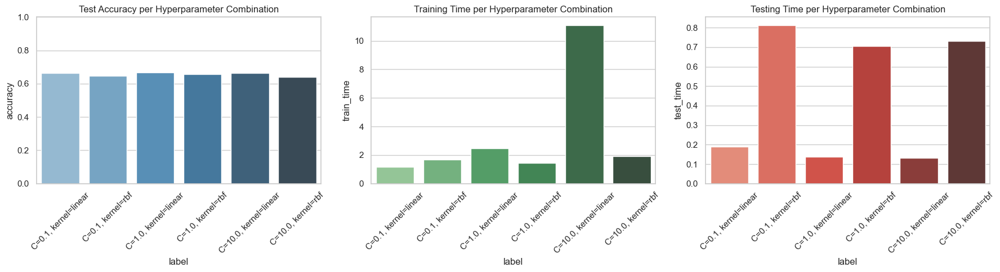


Best Hyperparameters Based on Test Accuracy:
C                              1.0
kernel                      linear
gamma                        scale
accuracy                  0.667314
train_time                2.457846
test_time                 0.138037
label         C=1.0, kernel=linear
Name: 2, dtype: object


In [111]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import ParameterGrid
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import time
import pandas as pd

# Step 1: Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 2: Define the hyperparameters manually
param_grid = {
    'C': [0.1, 1, 10],
    'gamma': ['scale'],
    'kernel': ['linear', 'rbf']
}

# Lists to store results
results = []

# Loop through all combinations of hyperparameters
for params in ParameterGrid(param_grid):
    svc = SVC(**params)

    # Train time
    start_train = time.time()
    svc.fit(X_train_scaled, y_train)
    train_time = time.time() - start_train

    # Test time
    start_test = time.time()
    y_pred_test = svc.predict(X_test_scaled)
    test_time = time.time() - start_test

    # Accuracy
    accuracy_SVC = accuracy_score(y_test, y_pred_test)

    # Save results
    results.append({
        'C': params['C'],
        'kernel': params['kernel'],
        'gamma': params['gamma'],
        'accuracy': accuracy_SVC,
        'train_time': train_time,
        'test_time': test_time
    })

# Convert to DataFrame for easy plotting
results_df = pd.DataFrame(results)

# Create a label column for the x-axis
results_df['label'] = results_df.apply(lambda row: f"C={row['C']}, kernel={row['kernel']}", axis=1)

# Plotting
plt.figure(figsize=(18, 5))

# Accuracy
plt.subplot(1, 3, 1)
sns.barplot(data=results_df, x='label', y='accuracy', palette='Blues_d')
plt.title('Test Accuracy per Hyperparameter Combination')
plt.xticks(rotation=45)
plt.ylim(0, 1)

# Training Time
plt.subplot(1, 3, 2)
sns.barplot(data=results_df, x='label', y='train_time', palette='Greens_d')
plt.title('Training Time per Hyperparameter Combination')
plt.xticks(rotation=45)

# Testing Time
plt.subplot(1, 3, 3)
sns.barplot(data=results_df, x='label', y='test_time', palette='Reds_d')
plt.title('Testing Time per Hyperparameter Combination')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()
with open('svm.pkl', 'wb') as file:
    pickle.dump(svc, file)
# Print best combination
best_row = results_df.loc[results_df['accuracy'].idxmax()]
print("\nBest Hyperparameters Based on Test Accuracy:")
print(best_row)


## CatBoost and Lightgbm Models

Naive Bayes Accuracy: 0.6220
CatBoost Accuracy: 0.6654
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6533
[LightGBM] [Info] Number of data points in the train set: 6179, number of used features: 30
[LightGBM] [Info] Start training from score -1.228935
[LightGBM] [Info] Start training from score -1.471909
[LightGBM] [Info] Start training from score -0.738335
LightGBM Accuracy: 0.6764


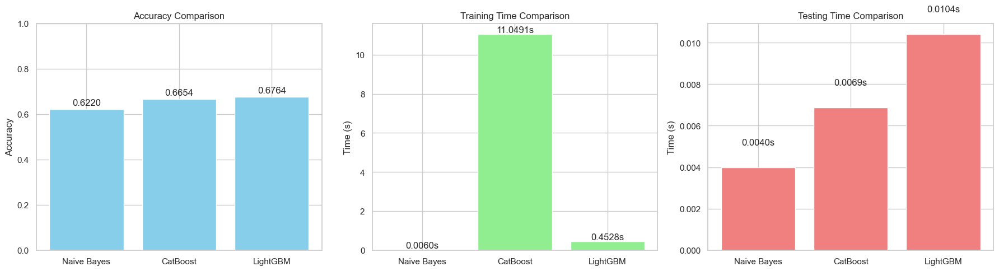

In [112]:
from sklearn.naive_bayes import GaussianNB
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import time

# Lists to store results
models = ['Naive Bayes', 'CatBoost', 'LightGBM']
accuracy_scores = []
train_times = []
test_times = []

# =========================
# Naive Bayes
nb_model = GaussianNB()
start_train = time.time()
nb_model.fit(X_train, y_train)
train_times.append(time.time() - start_train)

start_test = time.time()
y_pred_nb = nb_model.predict(X_test)
test_times.append(time.time() - start_test)

acc_nb = accuracy_score(y_test, y_pred_nb)
accuracy_scores.append(acc_nb)
print(f"Naive Bayes Accuracy: {acc_nb:.4f}")

# =========================
# CatBoost
catboost_model = CatBoostClassifier(verbose=0)
start_train = time.time()
catboost_model.fit(X_train, y_train)
train_times.append(time.time() - start_train)

start_test = time.time()
y_pred_cat = catboost_model.predict(X_test)
test_times.append(time.time() - start_test)

acc_cat = accuracy_score(y_test, y_pred_cat)
accuracy_scores.append(acc_cat)
print(f"CatBoost Accuracy: {acc_cat:.4f}")

# =========================
# LightGBM
lgb_model = LGBMClassifier()
start_train = time.time()
lgb_model.fit(X_train, y_train)
train_times.append(time.time() - start_train)

start_test = time.time()
y_pred_lgb = lgb_model.predict(X_test)
test_times.append(time.time() - start_test)

acc_lgb = accuracy_score(y_test, y_pred_lgb)
accuracy_scores.append(acc_lgb)
print(f"LightGBM Accuracy: {acc_lgb:.4f}")

# =========================
# Plotting
plt.figure(figsize=(18, 5))

# Accuracy Plot
plt.subplot(1, 3, 1)
bars = plt.bar(models, accuracy_scores, color='skyblue')
plt.title('Accuracy Comparison')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, f'{yval:.4f}', ha='center', va='bottom')

# Training Time Plot
plt.subplot(1, 3, 2)
bars = plt.bar(models, train_times, color='lightgreen')
plt.title('Training Time Comparison')
plt.ylabel('Time (s)')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, f'{yval:.4f}s', ha='center', va='bottom')

# Testing Time Plot
plt.subplot(1, 3, 3)
bars = plt.bar(models, test_times, color='lightcoral')
plt.title('Testing Time Comparison')
plt.ylabel('Time (s)')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.001, f'{yval:.4f}s', ha='center', va='bottom')

plt.tight_layout()
plt.show()
dict_cat={
    "naive_beyes":nb_model,
    "catBoost":catboost_model,
    "lightGBM":lgb_model
}
with open('catBoost.pkl', 'wb') as file:
    pickle.dump(dict_cat, file)


In [113]:
# ###import pandas as pd
# import numpy as np
# from sklearn.model_selection import train_test_split, cross_val_score
# from sklearn.preprocessing import StandardScaler
# from sklearn.linear_model import LogisticRegression
# from sklearn.ensemble import RandomForestClassifier
# from xgboost import XGBClassifier
# from imblearn.over_sampling import SMOTE
# from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report
# import time
# import matplotlib.pyplot as plt
# import seaborn as sns

# # Assuming df, target_col, X_best, and selected_features are defined
# print("\nClass distribution:")
# print(df[target_col].value_counts())

# # Prepare data
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X_best)
# X_scaled_df = pd.DataFrame(X_scaled, columns=selected_features)

# # Train-test split (stratified)
# X_train, X_test, y_train, y_test = train_test_split(
#     X_scaled_df, df[target_col], test_size=0.2, random_state=42, stratify=df[target_col]
# )
# print(f"Training set size: {X_train.shape}")
# print(f"Test set size: {X_test.shape}")

# # Apply SMOTE
# smote = SMOTE(sampling_strategy='auto', k_neighbors=3, random_state=42)
# X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
# print(f"Resampled training set size: {X_train_smote.shape}")
# print("\nTraining class distribution after SMOTE:")
# print(y_train_smote.value_counts())

# # Define models and hyperparameters
# models = {
#     'LogisticRegression': {
#         'model': LogisticRegression,
#         'params': {
#             'C': [0.1, 1, 10],
#             'solver': ['lbfgs', 'liblinear', 'saga'],
#             'fixed': {'max_iter': 1000, 'random_state': 0}
#         }
#     },
#     'RandomForest': {
#         'model': RandomForestClassifier,
#         'params': {
#             'n_estimators': [50, 100, 200],
#             'max_depth': [10, 20, None],
#             'fixed': {'random_state': 0}
#         }
#     },
#     'XGBoost': {
#         'model': XGBClassifier,
#         'params': {
#             'n_estimators': [50, 100, 200],
#             'learning_rate': [0.01, 0.1, 0.3],
#             'fixed': {'random_state': 42, 'eval_metric': 'mlogloss'}
#         }
#     }
# }

# # Store results
# results = []

# # Train and evaluate models
# for model_name, config in models.items():
#     print(f"\nTraining {model_name}...")
#     model_class = config['model']
#     param1_name, param1_values = list(config['params'].items())[0]
#     param2_name, param2_values = list(config['params'].items())[1]
#     fixed_params = config['params']['fixed']

#     for param1 in param1_values:
#         for param2 in param2_values:
#             # Set parameters
#             params = {param1_name: param1, param2_name: param2, **fixed_params}
#             model = model_class(**params)

#             # Cross-validation
#             cv_scores = cross_val_score(model, X_train_smote, y_train_smote, cv=10, scoring='accuracy')
#             cv_accuracy = cv_scores.mean()
#             cv_std = cv_scores.std()

#             # Train model
#             start_time = time.time()
#             model.fit(X_train_smote, y_train_smote)
#             train_time = time.time() - start_time

#             # Test model
#             start_time = time.time()
#             y_pred = model.predict(X_test)
#             test_time = time.time() - start_time

#             # Evaluate
#             accuracy = accuracy_score(y_test, y_pred)
#             f1 = f1_score(y_test, y_pred, average='macro')
#             conf_matrix = confusion_matrix(y_test, y_pred)
#             try:
#                 class_report = classification_report(y_test, y_pred)
#             except ValueError as e:
#                 class_report = f"Error in classification report: {str(e)}\n" \
#                                f"Unique labels in y_test: {np.unique(y_test)}\n" \
#                                f"Unique labels in y_pred: {np.unique(y_pred)}"

#             # Print evaluation
#             print(f"\n{model_name} ({param1_name}={param1}, {param2_name}={param2})")
#             print(f"Cross-Validation Accuracy: {cv_accuracy:.4f} ± {cv_std:.4f}")
#             print(f"Test Accuracy: {accuracy:.4f}")
#             print(f"Macro F1-Score: {f1:.4f}")
#             print("Confusion Matrix:")
#             print(conf_matrix)
#             print("\nClassification Report:")
#             print(class_report)

#             # Store results
#             results.append({
#                 'Model': model_name,
#                 'Params': f"{param1_name}={param1}, {param2_name}={param2}",
#                 'Train_Time': train_time,
#                 'Test_Time': test_time,
#                 'Accuracy': accuracy,
#                 'F1_Score': f1,
#                 'CV_Accuracy': cv_accuracy
#             })

# # Convert results to DataFrame
# results_df = pd.DataFrame(results)
# print("\nSummary Results:")
# print(results_df[['Model', 'Params', 'CV_Accuracy', 'Accuracy', 'F1_Score', 'Train_Time', 'Test_Time']])

# # Plotting
# sns.set_style('darkgrid')  # Use Seaborn style

# # Training Time Bar Graph
# plt.figure(figsize=(14, 6))
# sns.barplot(data=results_df, x='Params', y='Train_Time', hue='Model')
# plt.title('Total Training Time by Model and Hyperparameters')
# plt.xticks(rotation=45, ha='right')
# plt.ylabel('Training Time (seconds)')
# plt.tight_layout()
# plt.savefig('training_time.png')
# plt.close()

# # Test Time Bar Graph
# plt.figure(figsize=(14, 6))
# sns.barplot(data=results_df, x='Params', y='Test_Time', hue='Model')
# plt.title('Total Test Time by Model and Hyperparameters')
# plt.xticks(rotation=45, ha='right')
# plt.ylabel('Test Time (seconds)')
# plt.tight_layout()
# plt.savefig('test_time.png')
# plt.close()

# # F1-Score Bar Graph
# plt.figure(figsize=(14, 6))
# sns.barplot(data=results_df, x='Params', y='F1_Score', hue='Model')
# plt.title('Macro F1-Score by Model and Hyperparameters')
# plt.xticks(rotation=45, ha='right')
# plt.ylabel('Macro F1-Score')
# plt.tight_layout()
# plt.savefig('f1_score.png')
# plt.close()

# Summary of all Models " 10 Models "

In [114]:
# import pandas as pd

# # List of model names
# models = ['Logistic Regression', 'Random Forest', 'Decision Tree', 'Gradient Boosting', 
#           'XGBoost', 'CatBoost', 'LightGBM', 'Naive Bayes', 'SVC', 'KNN']

# # Accuracy scores (make sure these variables exist in your code)
# accuracy_scores = [
#     log_test_acc * 100,       # 1
#     cv_score_rf * 100,         # 2
#     accuracy_DT * 100,         # 3
#     cv_score_gb * 100,         # 4
#     cv_score_xgb * 100,        # 5
#     acc_cat * 100,             # 6
#     acc_lgb * 100,             # 7
#     acc_nb * 100,              # 8
#     accuracy_SVC * 100,        # 9
#     final_acc * 100            # 10
# ]

# # Create DataFrame
# accuracy_df = pd.DataFrame({
#     'Model': models,
#     'Accuracy (%)': accuracy_scores
# })

# # Sort by accuracy
# sorted_accuracy_df = accuracy_df.sort_values(by='Accuracy (%)', ascending=False)

# # Display table
# print(sorted_accuracy_df)


In [115]:
# # visualizing the accuracy of each model
# plt.figure(figsize=(12, 6))  # Adjust the width and height as needed

# # Create the barplot using Accuracy
# sns.barplot(x='Model', y='Accuracy (%)', data=accuracy_df, palette='viridis')

# # Add title and labels
# plt.title('Accuracy of Each Model')
# plt.xlabel('Model')
# plt.ylabel('Accuracy (%)')

# # Rotate x-axis labels for better readability
# plt.xticks(rotation=45, ha='right')
# plt.tight_layout()
# plt.show()


In [116]:
# Web Scrapping but need login
# ***********************************************************************************************************************************



# import time
# import re
# import imaplib
# import email
# import undetected_chromedriver as uc
# from selenium.webdriver.common.by import By
# from selenium.webdriver.support.ui import WebDriverWait
# from selenium.webdriver.support import expected_conditions as EC
# from selenium.common.exceptions import TimeoutException
# from bs4 import BeautifulSoup
# from dotenv import load_dotenv
# import os

# # Load environment variables
# load_dotenv()

# AIRBNB_EMAIL = os.getenv("AIRBNB_EMAIL")
# AIRBNB_PASSWORD = os.getenv("AIRBNB_PASSWORD")
# GMAIL_USER = os.getenv("GMAIL_USER")
# GMAIL_APP_PASSWORD = os.getenv("GMAIL_APP_PASSWORD")
# USER_IDS = [3881880]

# def fetch_airbnb_otp(gmail_user, gmail_app_password, timeout=60):
#     M = imaplib.IMAP4_SSL("imap.gmail.com")
#     M.login(gmail_user, gmail_app_password)
#     M.select("INBOX")
#     deadline = time.time() + timeout
#     otp_code = None

#     while time.time() < deadline and otp_code is None:
#         typ, msg_nums = M.search(None, '(UNSEEN FROM "notify@airbnb.com")')
#         for num in msg_nums[0].split():
#             typ, msg_data = M.fetch(num, "(RFC822)")
#             msg = email.message_from_bytes(msg_data[0][1])

#             body = ""
#             if msg.is_multipart():
#                 for part in msg.walk():
#                     if part.get_content_type() == "text/plain":
#                         body = part.get_payload(decode=True).decode(errors="ignore")
#                         break
#             else:
#                 body = msg.get_payload(decode=True).decode(errors="ignore")

#             m = re.search(r"\b(\d{6})\b", body)
#             if m:
#                 otp_code = m.group(1)
#                 break

#         if not otp_code:
#             time.sleep(5)

#     M.logout()
#     if not otp_code:
#         raise RuntimeError("Timed out fetching OTP from email")
#     return otp_code

# def login_with_selenium():
#     options = uc.ChromeOptions()
#     options.add_argument("--window-size=1920,1080")
#     options.add_argument("--disable-gpu")
#     options.add_argument("--disable-extensions")
#     options.add_argument("--no-sandbox")
#     options.add_argument("--disable-dev-shm-usage")
#     options.add_argument("--dns-prefetch-disable")

#     driver = uc.Chrome(options=options)
#     wait = WebDriverWait(driver, 60)

#     try:
#         print("Opening Airbnb login page...")
#         driver.get("https://www.airbnb.com/login")
#         time.sleep(2)

#         # Email
#         email_field = wait.until(EC.presence_of_element_located((By.NAME, "email")))
#         email_field.send_keys(AIRBNB_EMAIL)
        
#         continue_button = wait.until(EC.element_to_be_clickable((By.XPATH, "//button[@type='submit']")))
#         continue_button.click()
#         time.sleep(2)

#         # Password
#         password_field = wait.until(EC.element_to_be_clickable((By.NAME, "password")))
#         password_field.send_keys(AIRBNB_PASSWORD)
        
#         login_button = wait.until(EC.element_to_be_clickable((By.XPATH, "//button[@type='submit']")))
#         login_button.click()
#         time.sleep(5)

#         # Handle OTP
#         try:
#             otp_field = wait.until(EC.presence_of_element_located((By.XPATH, "//input[contains(@id, 'otp') or contains(@aria-label, 'code')]")))
#             print("Waiting for OTP...")
#             otp_code = fetch_airbnb_otp(GMAIL_USER, GMAIL_APP_PASSWORD)
#             otp_field.send_keys(otp_code)

#             verify_button = wait.until(EC.element_to_be_clickable((By.XPATH, "//button[@type='submit']")))
#             verify_button.click()
#             time.sleep(5)
#         except TimeoutException:
#             print("No OTP detected.")

#         if "Log in or sign up" in driver.page_source:
#             raise RuntimeError("Login failed.")

#         print("Login successful!")
#         return driver
#     except Exception as e:
#         driver.quit()
#         raise RuntimeError(f"Error during login: {str(e)}")

# def scrape_profile(driver, user_id):
#     url = f"https://www.airbnb.com/users/show/{user_id}"
#     print(f"Scraping profile: {url}")
#     driver.get(url)
#     time.sleep(3)

#     if "Log in or sign up" in driver.page_source:
#         raise RuntimeError("Not logged in!")

#     soup = BeautifulSoup(driver.page_source, "html.parser")
#     text = driver.page_source

#     name = None
#     h1 = soup.find("h1")
#     if h1:
#         name = h1.get_text(strip=True)

#     loc = None
#     m1 = re.search(r"Lives in ([A-Za-z ,]+)", text)
#     if m1:
#         loc = m1.group(1).strip()

#     joined = None
#     m2 = re.search(r"Joined in ([A-Za-z]+ \d{4}|\d{4})", text)
#     if m2:
#         joined = m2.group(1).strip()

#     reviews = []
#     for review_div in soup.find_all("div", class_=lambda c: c and ("review" in c.lower() or "comment" in c.lower())):
#         text = review_div.get_text(strip=True)
#         if text and len(text) > 10:
#             reviews.append(text)

#     return {
#         "user_id": user_id,
#         "name": name,
#         "location": loc,
#         "joined": joined,
#         "host_reviews": reviews
#     }

# def main():
#     try:
#         driver = login_with_selenium()
#         data = []
#         for uid in USER_IDS:
#             profile = scrape_profile(driver, uid)
#             data.append(profile)
#             time.sleep(2)

#         from pprint import pprint
#         pprint(data)

#     except Exception as e:
#         print(f"Error: {str(e)}")
#     finally:
#         if 'driver' in locals():
#             driver.quit()

# if __name__ == "__main__":
#     main()




# **************************************************************************************************************************

